# Objective

Using the data collected from existing customers, build a model that will help the marketing team identify potential customers who are relatively more likely to subscribe term deposit and thus increase their hit ratio. 

### What is a Term Deposit?
A Term deposit is a deposit that a bank or a financial institurion offers with a fixed rate (often better than just opening deposit account) in which your money will be returned back at a specific maturity time. For more information with regards to Term Deposits please click on this link from Investopedia: https://www.investopedia.com/terms/t/termdeposit.asp

### Attributes Information:

#### Bank client data:

1.age: Continuous feature 

2.job: Type of job (management, technician, entrepreneur, blue-collar, etc.)

3.marital: marital status(married, single, divorced)

4.education:education level (primary, secondary, tertiary)

5.default: has credit in default? 

6.housing: has housing loan? 

7.loan: has personal loan?

8.balance in account

#### Related to previous contact:

9.contact: contact communication type

10.month: last contact month of year

11.day: last contact day of the month

12.duration: last contact duration, in seconds*

#### Other attributes:

13.campaign: number of contacts performed during this campaign and for this client

14.pdays: number of days that passed by after the client was last contacted from a previous campaign(-1 tells us the person has not been contacted or contact period is beyond 900 days)

15.previous: number of contacts performed before this campaign and for this client

16.poutcome: outcome of the previous marketing campaignOutput variable (desired target):

17.Target: Tell us has the client subscribed a term deposit. (Yes, No)

### Importing Libraries

In [163]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
warnings.filterwarnings("ignore")

In [164]:
# !pip install chart_studio

In [165]:
from plotly import tools
import chart_studio.plotly as py
import plotly.figure_factory as ff
import plotly.graph_objs as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

In [166]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

In [167]:
from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from scipy import stats
from sklearn import metrics
from sklearn.metrics import classification_report,confusion_matrix
from sklearn.metrics import accuracy_score # Performance measure – Accuracy
from sklearn import preprocessing

# !pip install yellowbrick

### AUC ROC curve
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve

In [168]:
#from sklearn.feature_extraction.text import CountVectorizer  #DT does not take strings as input for the model fit step....
from IPython.display import Image  
#import pydotplus as pydot
from sklearn import tree
from os import system

In [169]:
bank = pd.read_csv("bank-full.csv")

## 1. Univariate analysis


In [170]:
bank.head(10)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
5,35,management,married,tertiary,no,231,yes,no,unknown,5,may,139,1,-1,0,unknown,no
6,28,management,single,tertiary,no,447,yes,yes,unknown,5,may,217,1,-1,0,unknown,no
7,42,entrepreneur,divorced,tertiary,yes,2,yes,no,unknown,5,may,380,1,-1,0,unknown,no
8,58,retired,married,primary,no,121,yes,no,unknown,5,may,50,1,-1,0,unknown,no
9,43,technician,single,secondary,no,593,yes,no,unknown,5,may,55,1,-1,0,unknown,no


**Summary statistics**

- Mean Age is aproximately 41 years old. (Minimum: 18 years old and Maximum: 95 years old.)

- The mean balance is 1,362. However, the Standard Deviation (std) is a high number which means that the balance is widely distributed across the dataset.

**Note:** There are not that much insights wecan gain from the descriptive dataset since most of our descriptive data is located not in the "numeric" columns but in the "categorical columns".

- Minimum age: 18 years old and Maximum age: 95 years old.

- Age has mean and median almost equal to 40, it shows that the aga data is normally distributed

- Balance: Averege bank balance is 1,362. Standard Deviation (std) is a high number so we can understand through this that the balance is heavily distributed across the dataset.

- Mean & Median value of the balance attribute has lot of difference which means you will find high level of data skewness and outlier in its distribution

- There are not much insights we can gain from the descriptive dataset since most of our descriptive data is located not in the "numeric" columns but in the "categorical columns".

In [171]:
bank.describe()

,age,balance,day,duration,campaign,pdays,previous
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,1362.272058,15.806419,258.163080,2.763841,40.197828,0.580323
std,10.618762,3044.765829,8.322476,257.527812,3.098021,100.128746,2.303441
min,18.000000,-8019.000000,1.000000,0.000000,1.000000,-1.000000,0.000000
25%,33.000000,72.000000,8.000000,103.000000,1.000000,-1.000000,0.000000
50%,39.000000,448.000000,16.000000,180.000000,2.000000,-1.000000,0.000000
75%,48.000000,1428.000000,21.000000,319.000000,3.000000,-1.000000,0.000000
max,95.000000,102127.000000,31.000000,4918.000000,63.000000,871.000000,275.000000


#### Quite a large data set consists of 45211 rows and 17 columns

In [172]:
bank.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  object
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  object
 7   loan       45211 non-null  object
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  Target     45211 non-null  object
dtypes: int64(7), object(10)
memory usage: 5.9+ MB


In [173]:
bank.dtypes

age           int64
job          object
marital      object
education    object
default      object
balance       int64
housing      object
loan         object
contact      object
day           int64
month        object
duration      int64
campaign      int64
pdays         int64
previous      int64
poutcome     object
Target       object
dtype: object

In [174]:
len(bank)

45211

In [175]:
bank.columns

Index(['age', 'job', 'marital', 'education', 'default', 'balance', 'housing',
       'loan', 'contact', 'day', 'month', 'duration', 'campaign', 'pdays',
       'previous', 'poutcome', 'Target'],
      dtype='object')

In [176]:
### number of unique in each column
pd.DataFrame(bank.nunique(),columns=['total unique'])

,total unique
age,77
job,12
marital,3
education,4
default,2
balance,7168
housing,2
loan,2
contact,3
day,31


##### Check for class imbalace onthe 'Target' variable
Class imbalance occurs when the observations belonging to one class in the target are significantly higher than the other class or classes. A class distribution of 80:20 or greater is typically considered as an imbalance for a binary classification.

Some machine learning algorithms assume that data is equally distributed, applying them on imbalanced data often results in bias towards majority classes and poor classification of minority classes. Hence we need to identify & deal with class imbalance accordingly.

The code below that takes the target variable and outputs the distribution of classes in the target.

In [177]:
pd.DataFrame(bank['Target'].value_counts())

,Target
no,39922
yes,5289


#### Observations :
Target variable has two unique values: 'yes' and 'no', 5,289 and 39,922 respecitively. 
The 'Target' class distribution in the target is ~88:11 and is a clear indication of imbalance

In [178]:
# we are finding the percentage of each class in the feature 'y'
class_values = (bank['Target'].value_counts()/bank['Target'].value_counts().sum())*100
# print(pd.DataFrame(class_values))
pd.DataFrame(round(class_values,2).add_suffix(' %'))

,Target
no %,88.3
yes %,11.7


**Check Numeric and Categorical Features**

Check if numerical values are represented as strings in some feature. Or the categorical values in some features might be represented as some other datatypes instead of strings. Hence it's good idea to check for the datatypes of all the features.

In [179]:
# IDENTIFYING NUMERICAL FEATURES

numeric_data = bank.select_dtypes(include=np.number) # select_dtypes selects data with numeric features
numeric_col = numeric_data.columns # we will store the numeric features in a variable

print("Numeric Features:")
print(numeric_data.head())
print("===="*15)

Numeric Features:
   age  balance  day  duration  campaign  pdays  previous
0   58     2143    5       261         1     -1         0
1   44       29    5       151         1     -1         0
2   33        2    5        76         1     -1         0
3   47     1506    5        92         1     -1         0
4   33        1    5       198         1     -1         0


In [180]:
# IDENTIFYING CATEGORICAL FEATURES

categorical_data = bank.select_dtypes(exclude=np.number) # we will exclude data with numeric features
categorical_col = categorical_data.columns # we will store the categorical features in a variable

print("Categorical Features:")
print(categorical_data.head())
print("===="*15)

Categorical Features:
            job  marital  education default housing loan  contact month  \
0    management  married   tertiary      no     yes   no  unknown   may   
1    technician   single  secondary      no     yes   no  unknown   may   
2  entrepreneur  married  secondary      no     yes  yes  unknown   may   
3   blue-collar  married    unknown      no     yes   no  unknown   may   
4       unknown   single    unknown      no      no   no  unknown   may   

  poutcome Target  
0  unknown     no  
1  unknown     no  
2  unknown     no  
3  unknown     no  
4  unknown     no  


#### Univariate analysis of all Continuous columns

Just like for categorical columns, by performing a univariate analysis on the continuous columns, we can get a sense of the distrbution of values in every column and of the outliers in the data. Histograms are great for plotting the distribution of the data and boxplots are the best choice for visualizing outliers.

- The code below plots a histogram of all the continuous features and other that plots a boxplot of the same.

**Observation:**

- As we can see from the histogram, the features age, duration and campaign are heavily skewed and this is due to the presence of outliers as seen in the boxplot for these features. We will deal with these outliers in the steps below.
- Looking at the plot for pdays, we can infer that majority of the customers were being contacted for the first time because as per the feature description for pdays the value 999 indicates that the customer had not been contacted previously.
- Since the features pdays and previous consist majorly only of a single value, their variance is quite less and hence we can drop them since technically will be of no help in prediction.

**AGE:**
- Age looks uniformally distributed with small standard deviation.

- Majority of the people falls in the age group of 30 to 40, that goes to show that most of them are young professional -33 to 48 years old fall within the 25th to 75th percentiles

- It seems that bank executve has also called up in the age group of 70-90 which are low in numbers but it is a clear error and kind of possible outlier, as they can't be our target age group who will be ineterested in FD.

- It also seems that around 1500-1600 student has also been targeted for fd which is most likely to ignore the fd option we will verify that in our bivariate analysis.

**Balance:**

- Balance data is not normally distributed and looks highly skewed and seems to have lot of outliers. We will treat outliers going forward.

- There are around 7K, that is almost 10 % people with negative bank balance which may not be interested in fd at all as they are struggling with finance. So this needs to be taken care from bank side that the call to such people needs to be minimized .

- The distribution of balance has a huge standard deviation relative to the mean, suggesting large variabilities in customers' balance levels.

**Duration:**

- As observed from the historgram plot, the duration of contact has a median of 3 minutes, with an interquartile range of 1.73 minutes to 5.3 minutes. The left-skewed boxplot indicates that most calls are relatively short. Also, there is a large number of outliers ranging from 10 minutes to 40 minutes, which are worth further studying.

**Campaign:**

- The distribution of campagin: About half of the clients have been contacted by the bank for the second time, while 25% was first introduced to the term deposit. Most clients have been reached by the bank for one to three times, which is reasonable. However, some clients have been contacted by as high as 58 times, which is not normal. These clients may have some special needs that require frequent contact.

**Day:**

- Day seems to be normally dustributed,with median value of 16 being the last day of contact

**pday & Other numerical values** 

- These aren't help much to infer anything significant here. Infact most of the independent numerical attributes has nothing much to descibe(). We will have to do bivariate & multivariate analysis to catch some meaningful insights.

**Let's Convert duration attributes from seconds to minute to have better measure and analysis**


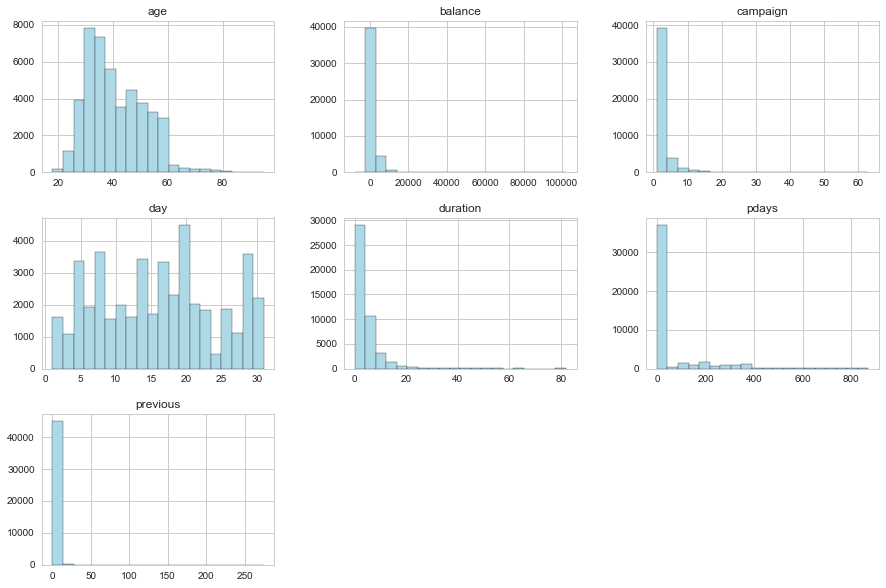

Descriptive stats of duration count    45211.000000
mean         4.302729
std          4.292132
min          0.000000
25%          1.720000
50%          3.000000
75%          5.320000
max         81.970000
Name: duration, dtype: float64
Descriptive stats of campaign count    45211.000000
mean         2.763841
std          3.098021
min          1.000000
25%          1.000000
50%          2.000000
75%          3.000000
max         63.000000
Name: campaign, dtype: float64
Descriptive stats of day count    45211.000000
mean        15.806419
std          8.322476
min          1.000000
25%          8.000000
50%         16.000000
75%         21.000000
max         31.000000
Name: day, dtype: float64
Descriptive stats of no of day past the capaign was last done:  count    45211.000000
mean        40.197828
std        100.128746
min         -1.000000
25%         -1.000000
50%         -1.000000
75%         -1.000000
max        871.000000
Name: pdays, dtype: float64


In [181]:
#Change the unit of 'duration' from seconds to minutes

newdf = bank.copy()

newdf['duration'] = newdf['duration'].apply(lambda n:n/60).round(2)

plt.style.use('seaborn-whitegrid')

newdf.hist(bins=20, figsize=(15,10), color='lightblue', edgecolor = 'black')
plt.show()


#print("Descriptive stats of age",dataframe1['age'].describe())
print("Descriptive stats of duration",newdf['duration'].describe())
print("Descriptive stats of campaign",newdf['campaign'].describe())
print("Descriptive stats of day", newdf['day'].describe())
print("Descriptive stats of no of day past the capaign was last done: ", newdf['pdays'].describe())

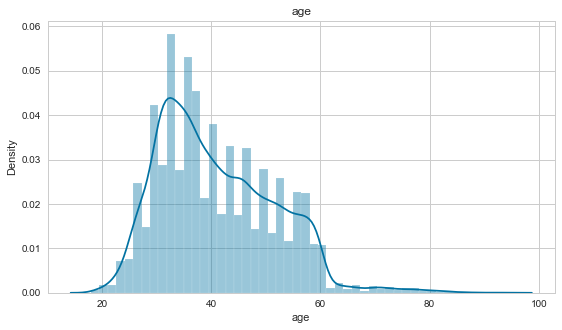

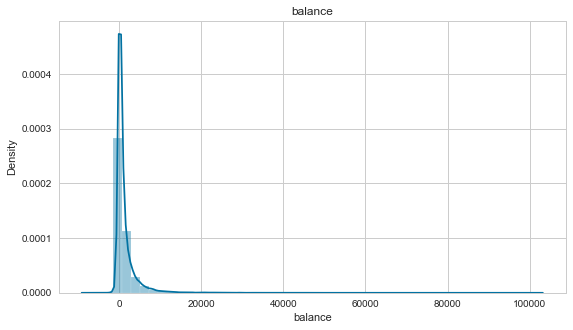

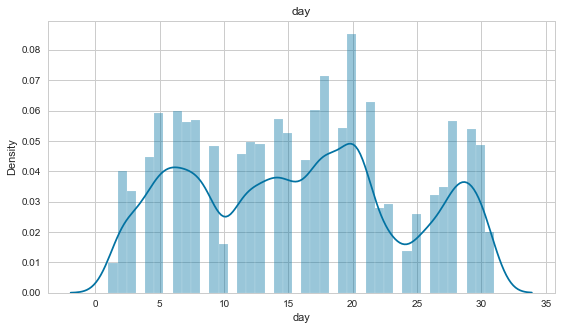

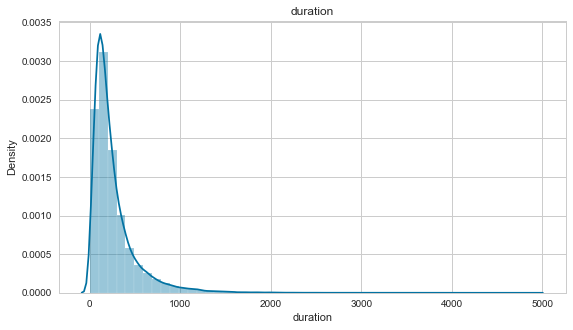

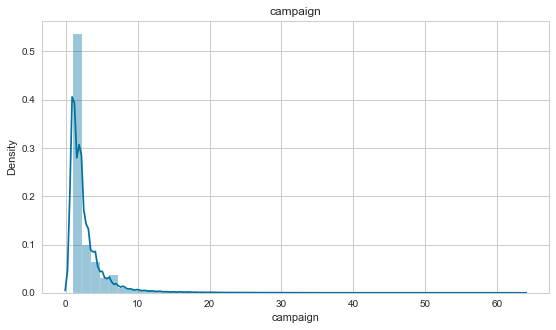

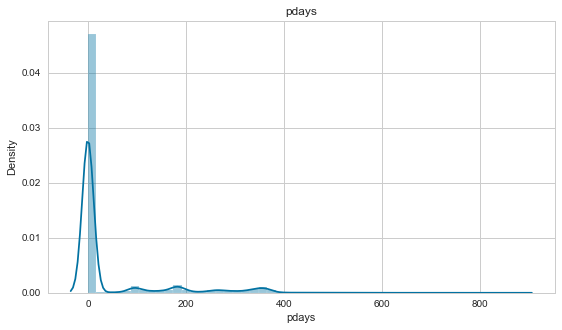

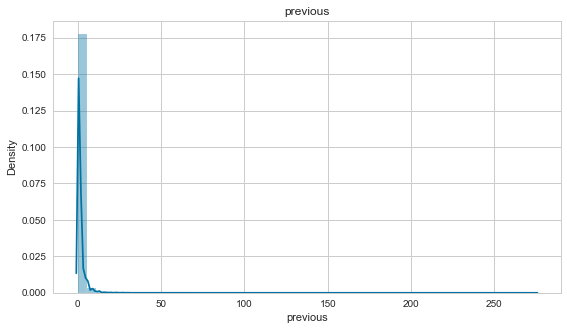

In [182]:
# Let's see how the numeric data is distributed.
for column in numeric_col:
    plt.figure(figsize=(20,5))
    plt.subplot(121)
    sns.distplot(bank[column])
    plt.title(column)

**Quick Insights From Boxplot Univariate distribution:**

- There seems to be an outlier in age, between the age group 70-90.

- Max customer falls in the age range of 32-48 . Median age is very close to 40 which i feel banks have targeted consideringf that they will will more aligned to take fd option. but i don't feel so. As the tendency of person nearing retorement or early starter in professinal, i feel can opt for fd. We will verify that going forward.

- In balance attribute there seems to be high level of skewness which we also observed in our histplot analayis. There are some extreme outliers brtween 60k euro to 100k euro. There are long tails towards right side so it seems to be highly skewed. -Balance attribute needs to be treated for removing the outlier which we will deal next.

- Day attribite seems to be normally distributed with no significant outliers as such.

- Rest of the numerical attribute doesn,t seems to be significant and are highly skewed with long tail mostly on the right side. As they are mostly skewed specially pdays and previous days,. There is nothing to statistically find here.


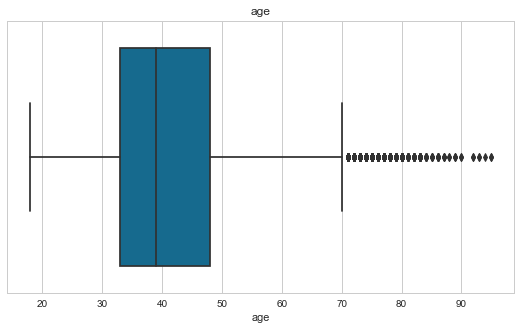

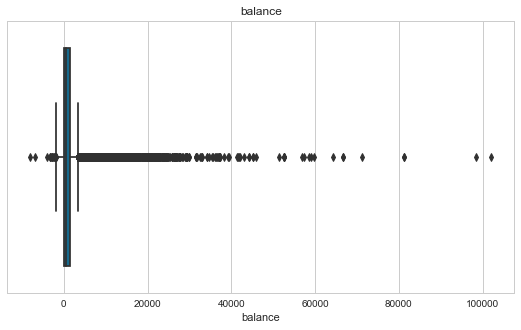

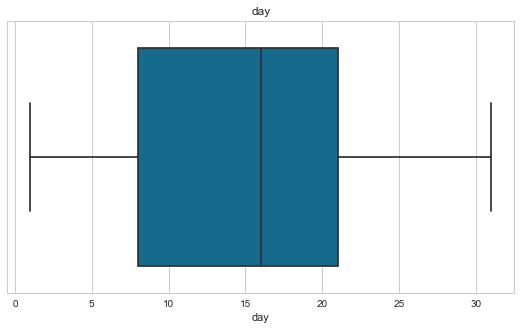

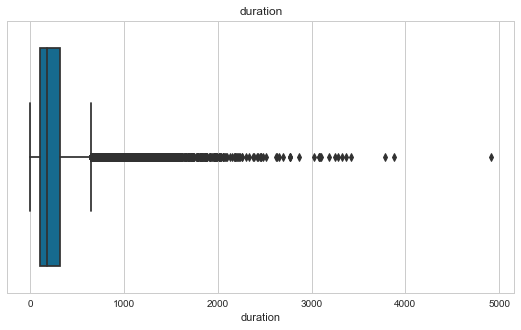

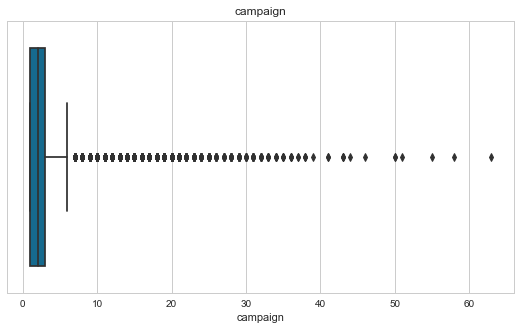

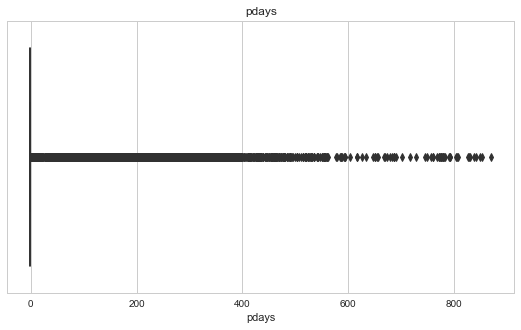

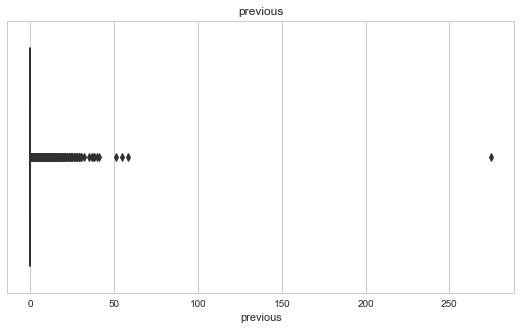

In [183]:
for column in numeric_col:
    plt.figure(figsize=(20,5))
    plt.subplot(122)
    sns.boxplot(bank[column])
    plt.title(column)

#### Check Missing Data
One of the main steps in data preprocessing is handling missing data. Missing data means absence of observations in columns that can be caused while procuring the data, lack of information, incomplete results etc. Feeding missing data to your machine learning model could lead to wrong prediction or classification. Hence it is necessary to identify missing values and treat them.

There are zero null vales, this will make life easier

In [184]:
bank.isnull().sum()

age          0
job          0
marital      0
education    0
default      0
balance      0
housing      0
loan         0
contact      0
day          0
month        0
duration     0
campaign     0
pdays        0
previous     0
poutcome     0
Target       0
dtype: int64

In [185]:
# Identify total missing values and the percentage of missing values in every feature of the dataset.
    
# Finding the total missing values and arranging them in ascending order
total = bank.isnull().sum()

# Converting the missing values in percentage
percent = (bank.isnull().sum()/bank.isnull().count())
print(percent)
bank.head()

age          0.0
job          0.0
marital      0.0
education    0.0
default      0.0
balance      0.0
housing      0.0
loan         0.0
contact      0.0
day          0.0
month        0.0
duration     0.0
campaign     0.0
pdays        0.0
previous     0.0
poutcome     0.0
Target       0.0
dtype: float64


,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no


#### Univariate distribution of continous variables Age, Balance and Duration

- Average age is between 30 and 50 Years and there are some outliers
- Average duration is between 0 and 800. Huge number of outliers and are right skewed
- Balance is right skewed and have huge number of outliers

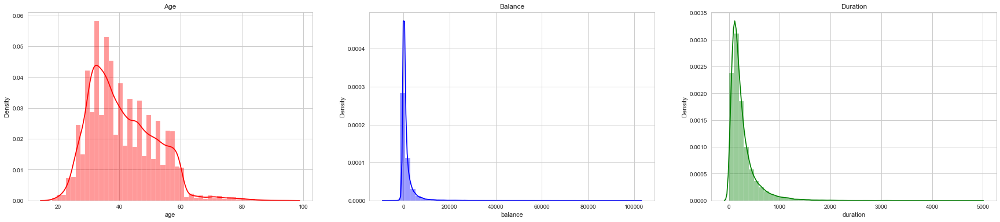

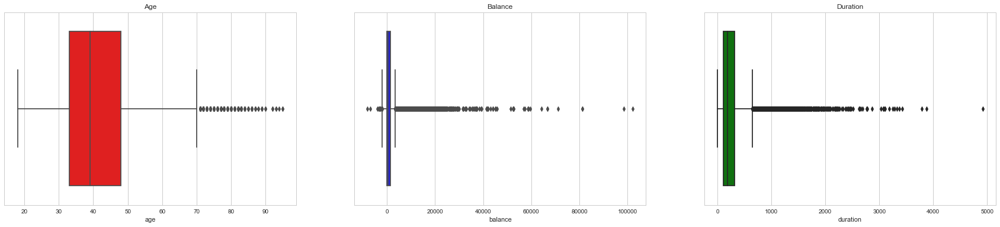

In [186]:
#Distribution of continous variables Age, Balance and Duration

plt.figure(figsize=(30,6))

#Subplot 1
plt.subplot(1,3,1)
plt.title('Age')
sns.distplot(bank['age'],color='red')

#Subplot 2
plt.subplot(1,3,2)
plt.title('Balance')
sns.distplot(bank['balance'],color='blue')

#Subplot 3
plt.subplot(1,3,3)
plt.title('Duration')
sns.distplot(bank['duration'],color='green')



plt.figure(figsize=(30,6))

#Subplot 1- Boxplot
plt.subplot(1,3,1)
plt.title('Age')
sns.boxplot(bank['age'],orient='horizondal',color='red')

#Subplot 2
plt.subplot(1,3,2)
plt.title('Balance')
sns.boxplot(bank['balance'],orient='horizondal',color='blue')

#Subplot 3
plt.subplot(1,3,3)
plt.title('Duration')
sns.boxplot(bank['duration'],orient='horizondal',color='green')

## Categorical columns

**Quick Observations:**
From the below visuals, we can make the following observations:

- The top three professions that our customers belong to are - administration, blue-collar jobs and technicians.
- A huge number of the customers are married.
- Majority of the customers do not have a credit in default
- Many of our past customers have applied for a housing loan but very few have applied for personal loans.
- Cell-phones seem to be the most favoured method of reaching out to customers.
- Many customers have been contacted in the month of May.
- The plot for the target variable shows heavy imbalance in the target variable.
- The missing values in some columns have been represented as unknown. unknown represents missing data. In the next task, we will treat these values.


**Phone Call Outcome:** 
- unknown 36959 failure 4901 other 1840 success 1511

- It seems that large share of poutcome result which accounts for 80 % has not been captured meaningfully. This makes outcome as an attribute very insignificant to measure and gain any insight

- The entire exercise to convert potentoal customer has not performed to the expecations as paltry 1511 person only responded positive. 
- This attribute needs to be resampled or ignored 


**Job Type Distribution:**

- blue-collar 9732 management 9458 technician 7597 admin. 5171 services 4154 retired 2264 self-employed 1579 entrepreneur 1487 unemployed 1303 housemaid 1240 student 938 unknown 288

- Blue-Collar, Management professionals & technicican jobs are in majority which were targeted by the bank.

- There are some cutomers who are unemployed, housemaid, student which were also targeted, which is not the good move as mostly they will not convert as fd customer. Though they are not significant in numbers

- There are few unknowns(around 220) people who were targeted, which don't seems to be a value addition so these needs to be ignored

- There are also some entrepreneurs and self-employed people which i feel will be hard to convert as fd customer. Chance of entrepreneurs and sel-employed person having FD i feel will be low. We will be verifying that when we do the bivariate analysis on categorical values using Target as hue.

**MaritalStataus:**

- married 27214 single 12790 divorced 5207

- ALmost 50% counting to 27214, customers are married which is as expected as they are more saving conscious.

- 28 % people are single , we expect more convesion rate from young single working professional,we will verify that when we do bivariate analysis

- There are some broken customers who are divorced, they account for 11 %, we should not expect them to convert to fd customers. That we will check going forward.

**EDUCATION:**

- Education Level Distribution: secondary 23202 tertiary 13301 primary 6851 unknown 1857

- It seems that around 51 % of the targeted customers are having secondar level of education and around 29 % customers are having qualification beyoind 12th class. It means that the targeted customers 51 % with secondary level education is somewhat not as per expectation and the campaign will not bear fruitful result. We neded to rethink the target audience here. Our focus should be more on working profesionals whose qualification will be beyound secondary level.

- We also found some unknown customers whose level of education is not clear this needs to be ignored or resampled.

- Around 6851 customers are still studying and should not be our target audience.They are very less liskely to take fd option. We will verify the same going forward.

**Credit Default:**

- Distribution: No : 44396 yes : 815

- It is good to see that almost 98 %  of the targeted customers don't default 

- Only 815 out 45211 people are defaulter and are not credit worthy. These people needs to be ignored while targeting for fd conversion. 

**PERSONAL LOAN:**

- no 37967 yes 7244

- 83 % customers have no personal loan lying with them only 17% people who were targeted have personal loan availed. We will see if people with no PL may have availed FD or not when we do bivariate analysis. I feel they are more likely to avail FD as compared to person who already have PL on their head to pay.

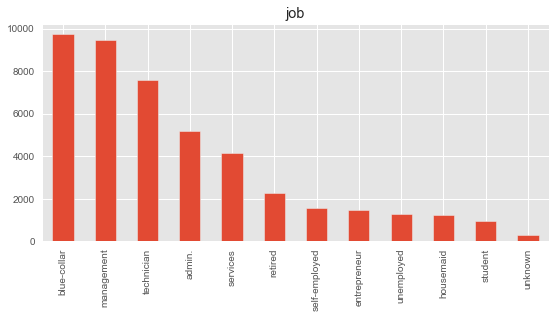

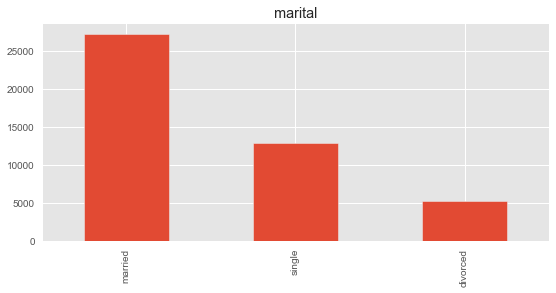

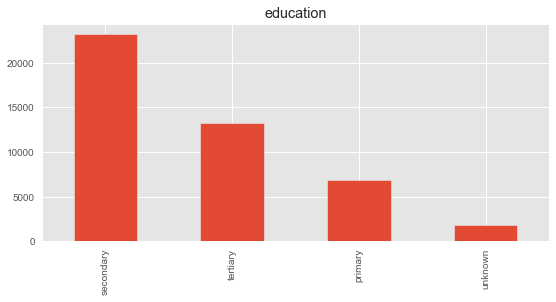

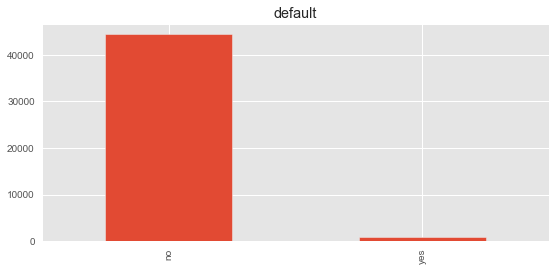

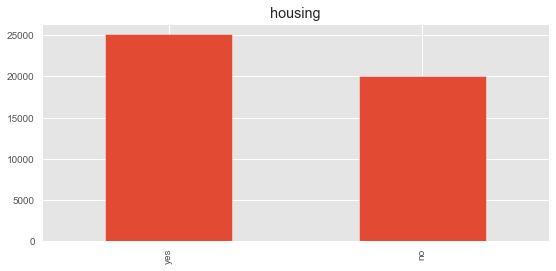

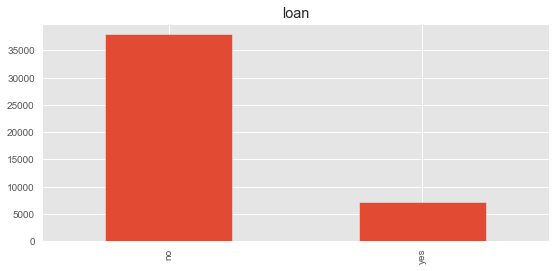

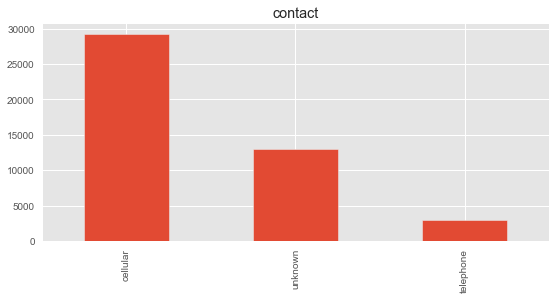

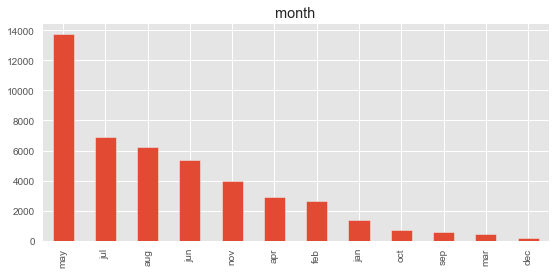

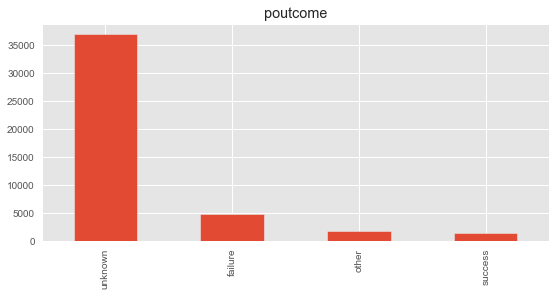

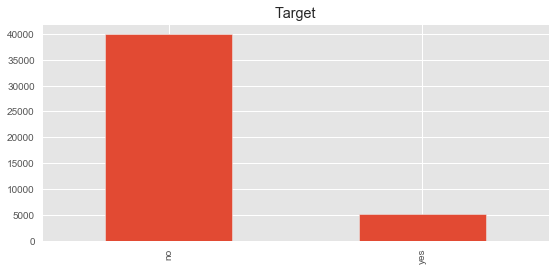

In [187]:
categorical_col = bank.select_dtypes(include=['object']).columns
plt.style.use('ggplot')
# Plotting a bar chart for each of the cateorical variable
for column in categorical_col:
    plt.figure(figsize=(20,4))
    plt.subplot(121)
    bank[column].value_counts().plot(kind='bar')
    plt.title(column)

#### Distribution of campaign contacts

- Average campaigns are around two contacts with people being contact once the most. This is normal since contacts reduce as a campaign progresses, as people reject taking up the offer.

- Significant outliers here

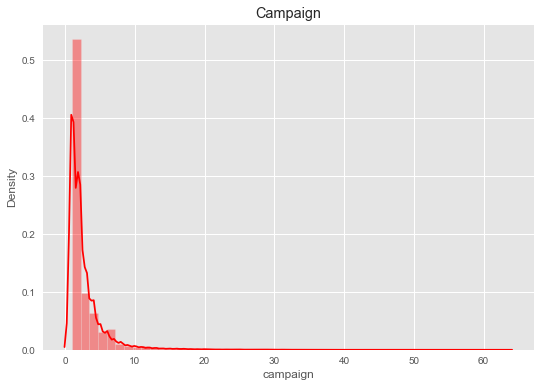

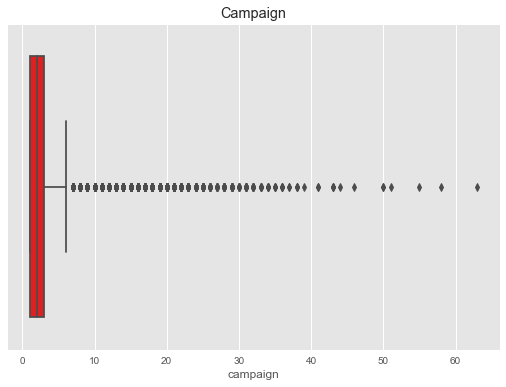

In [188]:
plt.figure(figsize=(30,6))

#Subplot 1
plt.subplot(1,3,1) 
plt.title('Campaign') 
sns.distplot(bank['campaign'],color='red')

#Subplot 2
# plt.subplot(1,3,2) 
# plt.title('P-days')
# sns.distplot(bank['pdays'],color='blue')

# #Subplot 3
# plt.subplot(1,3,3) 
# plt.title('Previous') 
# sns.distplot(bank['previous'],color='green')

plt.figure(figsize=(30,6))

#Subplot 1- Boxplot
plt.subplot(1,3,1) 
plt.title('Campaign') 
sns.boxplot(bank['campaign'],orient='horizondal',color='red')

#Subplot 2
# plt.subplot(1,3,2) 
# plt.title('P-days')
# sns.boxplot(bank['pdays'],orient='horizondal',color='blue')

# #Subplot 3
# plt.subplot(1,3,3)
# plt.title('Previous')
# sns.boxplot(bank['previous'],orient='horizondal',color='green')

#### Occupation:
- Number of Occupations: Blue-collar and Management are the occupations that are more prevalent in this dataset.

In [189]:
pd.DataFrame(bank['job'].value_counts())

,job
blue-collar,9732
management,9458
technician,7597
admin.,5171
services,4154
retired,2264
self-employed,1579
entrepreneur,1487
unemployed,1303
housemaid,1240


In [190]:
import squarify
bank = bank.drop(bank.loc[bank["balance"] == 0].index)

x = 0
y = 0
width = 100
height = 100

job_names = bank['job'].value_counts().index
values = bank['job'].value_counts().tolist()

normed = squarify.normalize_sizes(values, width, height)
rects = squarify.squarify(normed, x, y, width, height)

colors = ['rgb(200, 255, 144)','rgb(135, 206, 235)',
          'rgb(235, 164, 135)','rgb(220, 208, 255)',
          'rgb(253, 253, 150)','rgb(255, 127, 80)', 
         'rgb(218, 156, 133)', 'rgb(245, 92, 76)',
         'rgb(252,64,68)', 'rgb(154,123,91)']

shapes = []
annotations = []
counter = 0

for r in rects:
    shapes.append(
        dict(
            type = 'rect',
            x0 = r['x'],
            y0 = r['y'],
            x1 = r['x'] + r['dx'],
            y1 = r['y'] + r['dy'],
            line = dict(width=2),
            fillcolor = colors[counter]
        )
    )
    annotations.append(
        dict(
            x = r['x']+(r['dx']/2),
            y = r['y']+(r['dy']/2),
            text = values[counter],
            showarrow = False
        )
    )
    counter = counter + 1
    if counter >= len(colors):
        counter = 0
    
# For hover text
trace0 = go.Scatter(
    x = [ r['x']+(r['dx']/2) for r in rects],
    y = [ r['y']+(r['dy']/2) for r in rects],
    text = [ str(v) for v in job_names],
    mode='text',
)

layout = dict(
    title='Number of Occupations',
    height=700, 
    width=700,
    xaxis=dict(showgrid=False,zeroline=False),
    yaxis=dict(showgrid=False,zeroline=False),
    shapes=shapes,
    annotations=annotations,
    hovermode='closest'
)

# With hovertext
figure = dict(data=[trace0], layout=layout)

iplot(figure, filename='squarify-treemap')

**Marital Status**

In [191]:
pd.DataFrame(bank['marital'].value_counts())

,marital
married,24939
single,12018
divorced,4740


In [192]:
vals = bank['marital'].value_counts().tolist()
labels = ['married', 'divorced', 'single']

data = [go.Bar(
            x=labels,
            y=vals,
    marker=dict(
    color="#FE9A2E")
    )]

layout = go.Layout(
    title="Count by Marital Status",
)

fig = go.Figure(data=data, layout=layout)



iplot(fig, filename='basic-bar')

## 2. Multivariate analysis

#### Bivariate Analysis - Categorical Columns
Bivariate analysis involves checking the relationship between two variables simultaneously. In the code below, we plot every categorical feature against the target by plotting a barchart.

**Observations:**

- The common traits seen for customers who have subscribed for the term deposit are :
Customers having administrative jobs form the majority amongst those who have subscirbed to the term deposit with technicians being the second majority.
- They are married
- They hold a university degree
- They do not hold a credit in default
- Housing loan doesn't seem a priority to check for since an equal number of customers who have and have not subscribed to it seem to have subscribed to the term deposit.
- Cell-phones should be the preferred mode of contact for contacting customers.


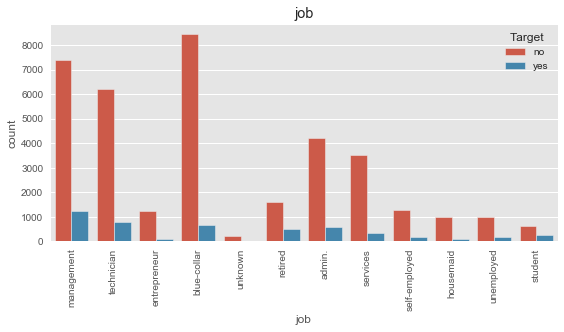

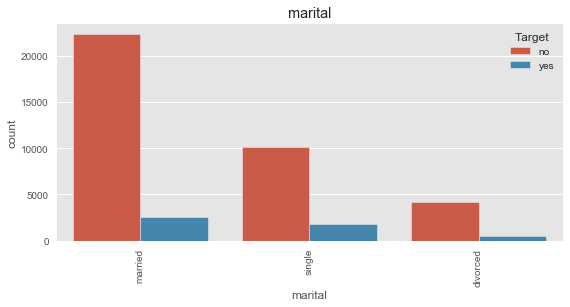

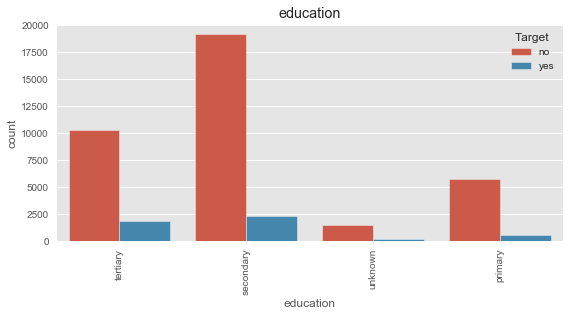

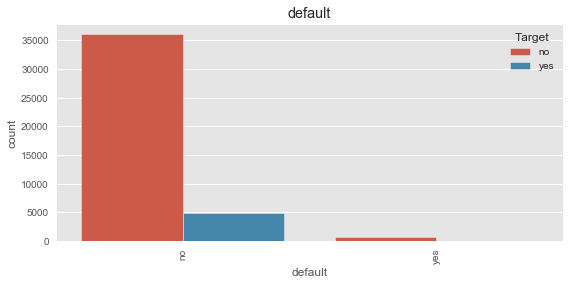

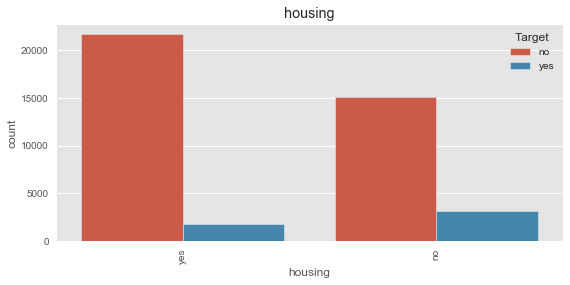

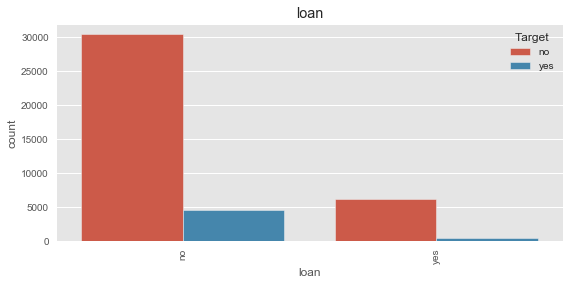

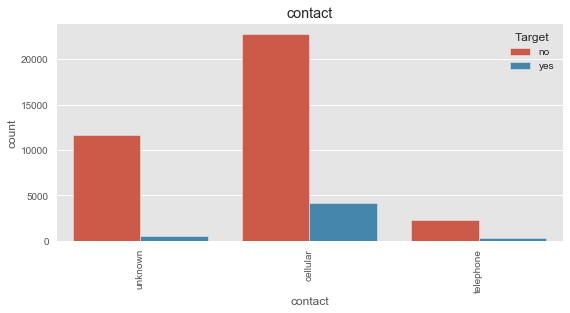

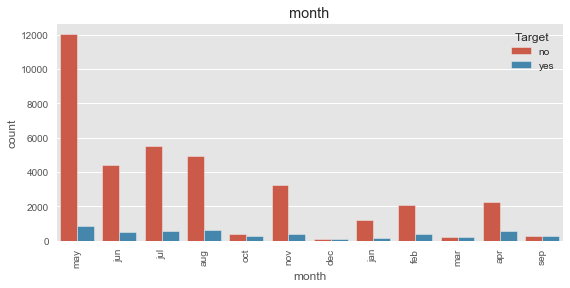

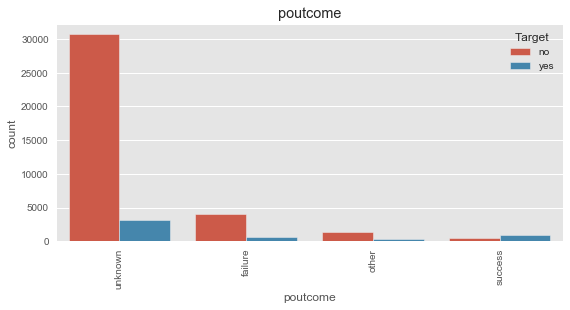

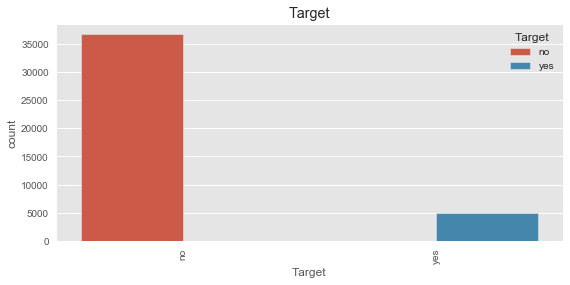

In [193]:
for column in categorical_col:
    plt.figure(figsize=(20,4))
    plt.subplot(121)
    sns.countplot(x=bank[column],hue=bank['Target'],data=bank)
    plt.title(column)
    plt.xticks(rotation=90)

**Term Subscriptions v Education**

- Those with secondary and tertiary seem to be more susceptible to subscribe to a term deposit 
- Most people in the data set did not subscribe to a term deposit so it makes
- Majority of people in the dataset have secondary education

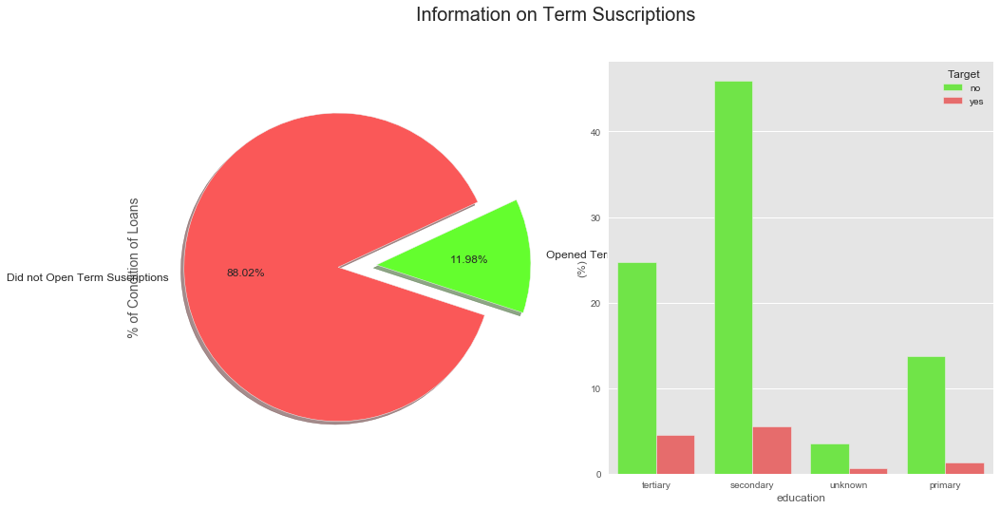

In [194]:
f, ax = plt.subplots(1,2, figsize=(16,8))

colors = ["#FA5858", "#64FE2E"]
labels ="Did not Open Term Suscriptions", "Opened Term Suscriptions"

plt.suptitle('Information on Term Suscriptions', fontsize=20)

bank["Target"].value_counts().plot.pie(explode=[0,0.25], autopct='%1.2f%%', ax=ax[0], shadow=True, colors=colors, 
                                             labels=labels, fontsize=12, startangle=25)


# ax[0].set_title('State of Loan', fontsize=16)
ax[0].set_ylabel('% of Condition of Loans', fontsize=14)

# sns.countplot('loan_condition', data=bank, ax=ax[1], palette=colors)
# ax[1].set_title('Condition of Loans', fontsize=20)
# ax[1].set_xticklabels(['Good', 'Bad'], rotation='horizontal')
palette = ["#64FE2E", "#FA5858"]

sns.barplot(x="education", y="balance", hue="Target", data=bank, palette=palette, estimator=lambda x: len(x) / len(bank) * 100)
ax[1].set(ylabel="(%)")
ax[1].set_xticklabels(bank["education"].unique(), rotation=0, rotation_mode="anchor")
plt.show()

#### Balance by Occupation: (write a bit more)

- Balance by Occupation: Management and Retirees are the ones who have the highest balance in their accounts.

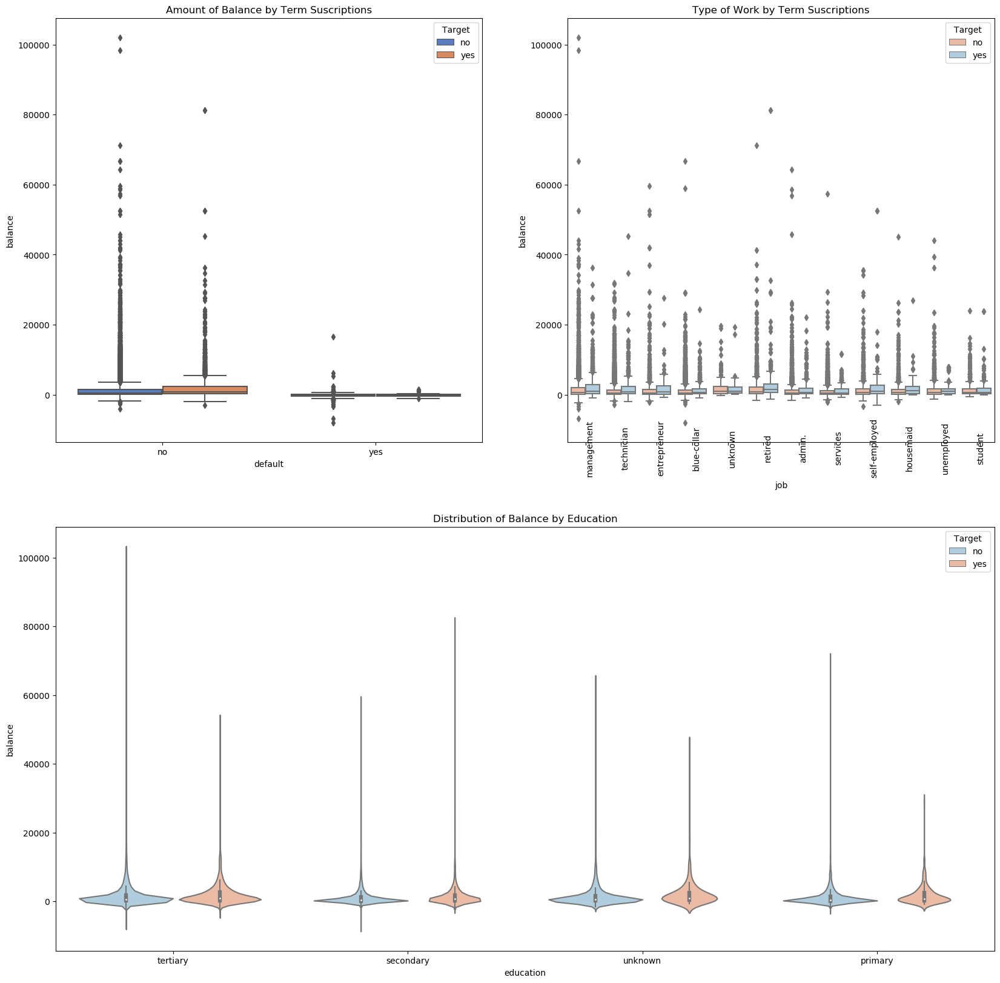

In [195]:
plt.style.use('default')
fig = plt.figure(figsize=(20,20))
ax1 = fig.add_subplot(221)
ax2 = fig.add_subplot(222)
ax3 = fig.add_subplot(212)

g = sns.boxplot(x="default", y="balance", hue="Target",
                    data=bank, palette="muted", ax=ax1)

g.set_title("Amount of Balance by Term Suscriptions")

# ax.set_xticklabels(bank["default"].unique(), rotation=45, rotation_mode="anchor")

g1 = sns.boxplot(x="job", y="balance", hue="Target",
                 data=bank, palette="RdBu", ax=ax2)

g1.set_xticklabels(bank["job"].unique(), rotation=90, rotation_mode="anchor")
g1.set_title("Type of Work by Term Suscriptions")

g2 = sns.violinplot(data=bank, x="education", y="balance", hue="Target", palette="RdBu_r")

g2.set_title("Distribution of Balance by Education")


plt.show()

#### Age by Occupation (say a bit more here)

- Age by Occupation: As expected, the Blue-Collar are the ones who have the highest median age while house-maid are the lowest.


In [196]:
# Now let's see which occupation tended to have more balance in their accounts

suscribed_bank = bank.loc[bank["Target"] == "yes"]

occupations = bank["job"].unique().tolist()

# Get the balances by jobs
management = suscribed_bank["age"].loc[suscribed_bank["job"] == "management"].values
technician = suscribed_bank["age"].loc[suscribed_bank["job"] == "technician"].values
services = suscribed_bank["age"].loc[suscribed_bank["job"] == "services"].values
retired = suscribed_bank["age"].loc[suscribed_bank["job"] == "retired"].values
blue_collar = suscribed_bank["age"].loc[suscribed_bank["job"] == "blue-collar"].values
unemployed = suscribed_bank["age"].loc[suscribed_bank["job"] == "unemployed"].values
entrepreneur = suscribed_bank["age"].loc[suscribed_bank["job"] == "entrepreneur"].values
housemaid = suscribed_bank["age"].loc[suscribed_bank["job"] == "housemaid"].values
self_employed = suscribed_bank["age"].loc[suscribed_bank["job"] == "self-employed"].values
student = suscribed_bank["age"].loc[suscribed_bank["job"] == "student"].values
admin = suscribed_bank["age"].loc[suscribed_bank["job"] == "admin"].values
unknown = suscribed_bank["age"].loc[suscribed_bank["job"] == "unknown"].values


ages = [management, technician, services, retired, blue_collar, unemployed, 
         entrepreneur, housemaid, self_employed, student, admin, unknown]

colors = ['rgba(93, 164, 214, 0.5)', 'rgba(255, 144, 14, 0.5)',
          'rgba(44, 160, 101, 0.5)', 'rgba(255, 65, 54, 0.5)', 
          'rgba(207, 114, 255, 0.5)', 'rgba(127, 96, 0, 0.5)',
         'rgba(229, 126, 56, 0.5)', 'rgba(229, 56, 56, 0.5)',
          'rgba(229, 126, 56, 0.5)', 'rgba(229, 56, 56, 0.5)',
          'rgba(229, 126, 56, 0.5)', 'rgba(229, 56, 56, 0.5)',
         'rgba(174, 229, 56, 0.5)', 'rgba(229, 56, 56, 0.5)',
         'rgba(229, 126, 56, 0.5)', 'rgba(228, 56, 56, 0.5)',
         'rgba(174, 229, 56, 0.5)', 'rgba(227, 56, 56, 0.5)']

traces = []

for xd, yd, cls in zip(occupations, ages, colors):
        traces.append(go.Box(
            y=yd,
            name=xd,
            boxpoints='all',
            jitter=0.5,
            whiskerwidth=0.2,
            fillcolor=cls,
            marker=dict(
                size=2,
            ),
            line=dict(width=1),
        ))

layout = go.Layout(
    title='Distribution of Ages by Occupation',
    yaxis=dict(
        autorange=True,
        showgrid=True,
        zeroline=True,
        dtick=5,
        gridcolor='rgb(255, 255, 255)',
        gridwidth=1,
        zerolinecolor='rgb(255, 255, 255)',
        zerolinewidth=2,
    ),
    margin=dict(
        l=40,
        r=30,
        b=80,
        t=100,
    ),
    paper_bgcolor='rgb(224,255,246)',
    plot_bgcolor='rgb(251,251,251)',
    showlegend=False
)

fig = go.Figure(data=traces, layout=layout)
iplot(fig)

#### Average Balance by Occupation

- Creating a "balance category to bucket them into groups or low, middle and high

- less than 0 = "negative"
    - greater than 0 and less/equal to 30000 ="low"
    - greater than 30000 and less/equal 40000 = "middle"
    - greater than 40000 = "high"
- Retirees and Entrepreneurs are the ones who have the highest balance in their accounts
- Surprisingly Unemployed also have high balance

In [197]:
round(bank['balance'].describe(),2)

count     41697.00
mean       1477.08
std        3143.61
min       -8019.00
25%         141.00
50%         535.00
75%        1583.00
max      102127.00
Name: balance, dtype: float64

In [198]:
# Balance Distribution

# Create a Balance Category
bank["balance_status"] = np.nan
lst = [bank]

for col in lst:
    col.loc[col["balance"] < 0, "balance_status"] = "negative"
    col.loc[(col["balance"] >= 0) & (col["balance"] <= 30000), "balance_status"] = "low"
    col.loc[(col["balance"] > 30000) & (col["balance"] <= 40000), "balance_status"] = "middle"
    col.loc[col["balance"] > 40000, "balance_status"] = "high"
    
# balance by balance_status
negative = bank["balance"].loc[bank["balance_status"] == "negative"].values.tolist()
low = bank["balance"].loc[bank["balance_status"] == "low"].values.tolist()
middle = bank["balance"].loc[bank["balance_status"] == "middle"].values.tolist()
high = bank["balance"].loc[bank["balance_status"] == "high"].values.tolist()


# Get the average by occupation in each balance category
job_balance = bank.groupby(['job', 'balance_status'])['balance'].mean()


trace1 = go.Barpolar(
    r=[-199.0, -392.0, -209.0, -247.0, -233.0, -270.0, -271.0, 0, -276.0, -134.5, -275.0, -281.0,],
    text=["blue-collar", "entrepreneur", "housemaid", "management", "retired", "self-employed",
         "services", "student", "technician", "unemployed", "admin", "unknown"],
    name='Negative Balance',
    marker=dict(
        color='rgb(246, 46, 46)'
    )
)
trace2 = go.Barpolar(
    r=[319.5, 283.0, 212.0, 313.0, 409.0, 274.5, 308.5, 253.0, 316.0, 330.0, 375.0, 381.0,],
    text=["blue-collar", "entrepreneur", "housemaid", "management", "retired", "self-employed",
         "services", "student", "technician", "unemployed", "admin", "unknown"],
    name='Low Balance',
    marker=dict(
        color='rgb(246, 97, 46)'
    )
)
trace3 = go.Barpolar(
    r=[2128.5, 2686.0, 2290.0, 2366.0, 2579.0, 2293.5, 2005.5, 2488.0, 2362.0, 1976.0, 2588.0, 2462.0],
    text=["blue-collar", "entrepreneur", "housemaid", "management", "retired", "self-employed",
         "services", "student", "technician", "unemployed", "admin", "unknown"],
    name='Middle Balance',
    marker=dict(
        color='rgb(246, 179, 46)'
    )
)
trace4 = go.Barpolar(
    r=[14247.5, 20138.5, 12278.5, 12956.0, 20723.0, 12159.0, 12223.0, 13107.0, 12063.0, 15107.5, 13063.0, 14107.5],
    text=["blue-collar", "entrepreneur", "housemaid", "management", "retired", "self-employed",
         "services", "student", "technician", "unemployed", "admin", "unknown"],
    name='High Balance',
    marker=dict(
        color='rgb(46, 246, 78)'
    )
)
data = [trace1, trace2, trace3, trace4]
layout = go.Layout(
    title='Mean Balance in Account<br> <i> by Job Occupation</i>',
    font=dict(
        size=12
    ),
    legend=dict(
        font=dict(
            size=16
        )
    ),
    radialaxis=dict(
        ticksuffix='%'
    ),
    orientation=270
)
fig = go.Figure(data=data, layout=layout)
iplot(fig, filename='polar-area-chart')

##### Marital Status and Balance
- Most divorced individuals have a low balance. Porbably having to split financial assets! 

In [199]:
# Distribution of Balances by Marital status
single = bank['balance'].loc[bank['marital'] == 'single'].values
married = bank['balance'].loc[bank['marital'] == 'married'].values
divorced = bank['balance'].loc[bank['marital'] == 'divorced'].values


single_dist = go.Histogram(
    x=single,
    histnorm='density', 
    name='single',
    marker=dict(
        color='#6E6E6E'
    )
)

    
married_dist = go.Histogram(
    x=married,
    histnorm='density', 
    name='married',
    marker=dict(
        color='#2E9AFE'
    )
)

divorced_dist = go.Histogram(
    x=divorced,
    histnorm='density', 
    name='divorced',
    marker=dict(
        color='#FA5858'
    )
)


fig = tools.make_subplots(rows=3, print_grid=False)

fig.append_trace(single_dist, 1, 1)
fig.append_trace(married_dist, 2, 1)
fig.append_trace(divorced_dist, 3, 1)


fig['layout'].update(showlegend=False, title="Balance Distributions by Marital Status",
                    height=1000, width=800)

iplot(fig, filename='custom-sized-subplot-with-subplot-titles')

In [200]:
# Notice how divorced have a considerably low amount of balance.

fig = ff.create_facet_grid(
    bank,
    x='duration',
    y='balance',
    color_name='marital',
    show_boxes=False,
    marker={'size': 10, 'opacity': 1.0},
    colormap={'single': 'rgb(165, 242, 242)', 'married': 'rgb(253, 174, 216)', 'divorced': 'rgba(201, 109, 59, 0.82)'}
)

iplot(fig, filename='facet - custom colormap')

#### Clustering Marital Status and Education
**Marital Status:** As discussed previously, the impact of a divorce has a significant impact on the balance of the individual.

**Education:** The level of education also has a significant impact on the amount of balance a prospect has.

**Loans** Whether the prospect has a previous loan has a significant impact on the amount of balance he or she has.

In [201]:
bank = bank.drop(bank.loc[bank["education"] == "unknown"].index)
bank['education'].unique()

array(['tertiary', 'secondary', 'primary'], dtype=object)

In [202]:
bank['marital/education'] = np.nan
lst = [bank]

for col in lst:
    col.loc[(col['marital'] == 'single') & (bank['education'] == 'primary'), 'marital/education'] = 'single/primary'
    col.loc[(col['marital'] == 'married') & (bank['education'] == 'primary'), 'marital/education'] = 'married/primary'
    col.loc[(col['marital'] == 'divorced') & (bank['education'] == 'primary'), 'marital/education'] = 'divorced/primary'
    col.loc[(col['marital'] == 'single') & (bank['education'] == 'secondary'), 'marital/education'] = 'single/secondary'
    col.loc[(col['marital'] == 'married') & (bank['education'] == 'secondary'), 'marital/education'] = 'married/secondary'
    col.loc[(col['marital'] == 'divorced') & (bank['education'] == 'secondary'), 'marital/education'] = 'divorced/secondary'
    col.loc[(col['marital'] == 'single') & (bank['education'] == 'tertiary'), 'marital/education'] = 'single/tertiary'
    col.loc[(col['marital'] == 'married') & (bank['education'] == 'tertiary'), 'marital/education'] = 'married/tertiary'
    col.loc[(col['marital'] == 'divorced') & (bank['education'] == 'tertiary'), 'marital/education'] = 'divorced/tertiary'
    
    
bank.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target,balance_status,marital/education
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no,low,married/tertiary
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no,low,single/secondary
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no,low,married/secondary
5,35,management,married,tertiary,no,231,yes,no,unknown,5,may,139,1,-1,0,unknown,no,low,married/tertiary
6,28,management,single,tertiary,no,447,yes,yes,unknown,5,may,217,1,-1,0,unknown,no,low,single/tertiary


Text(0.5, 1.0, 'Median Balance by Educational/Marital Group')

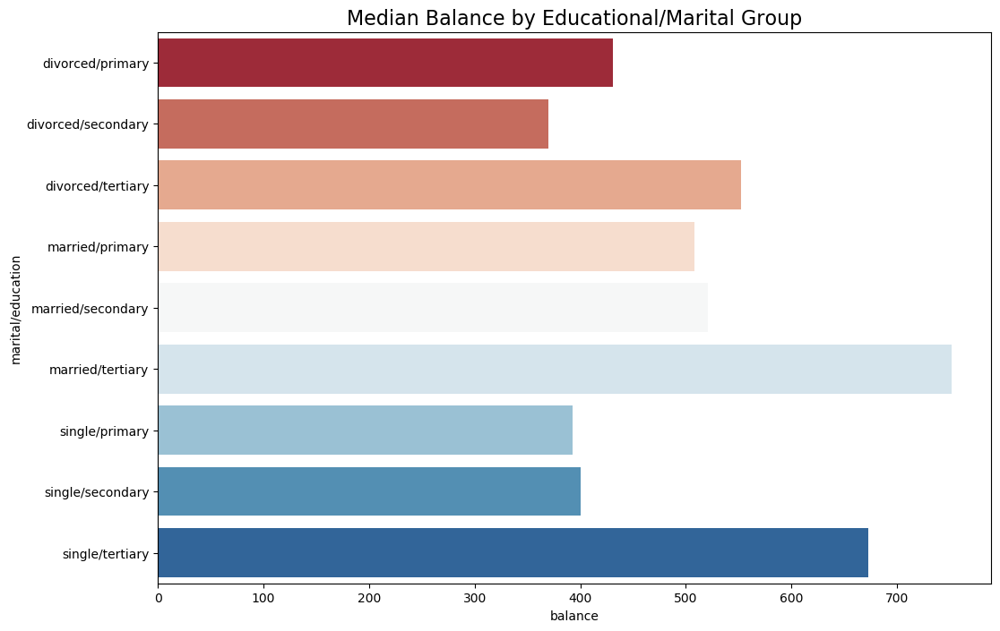

In [203]:
education_groups = bank.groupby(['marital/education'], as_index=False)['balance'].median()

fig = plt.figure(figsize=(12,8))

sns.barplot(x="balance", y="marital/education", data=education_groups,
            label="Total", palette="RdBu")

plt.title('Median Balance by Educational/Marital Group', fontsize=16)

**The Impact of Loans to Married/Educational Clusters**

Let's see the group who had loans from the marital/education group


In [204]:
loan_balance = bank.groupby(['marital/education', 'loan'], as_index=False)['balance'].median()


no_loan = loan_balance['balance'].loc[loan_balance['loan'] == 'no'].values
has_loan = loan_balance['balance'].loc[loan_balance['loan'] == 'yes'].values


labels = loan_balance['marital/education'].unique().tolist()


trace0 = go.Scatter(
    x=no_loan,
    y=labels,
    mode='markers',
    name='No Loan',
    marker=dict(
        color='rgb(175,238,238)',
        line=dict(
            color='rgb(0,139,139)',
            width=1,
        ),
        symbol='circle',
        size=16,
    )
)
trace1 = go.Scatter(
    x=has_loan,
    y=labels,
    mode='markers',
    name='Has a Previous Loan',
    marker=dict(
        color='rgb(250,128,114)',
        line=dict(
            color='rgb(178,34,34)',
            width=1,
        ),
        symbol='circle',
        size=16,
    )
)

data = [trace0, trace1]
layout = go.Layout(
    title="The Impact of Loans to Married/Educational Clusters",
    xaxis=dict(
        showgrid=False,
        showline=True,
        linecolor='rgb(102, 102, 102)',
        titlefont=dict(
            color='rgb(204, 204, 204)'
        ),
        tickfont=dict(
            color='rgb(102, 102, 102)',
        ),
        showticklabels=False,
        dtick=10,
        ticks='outside',
        tickcolor='rgb(102, 102, 102)',
    ),
    margin=dict(
        l=140,
        r=40,
        b=50,
        t=80
    ),
    legend=dict(
        font=dict(
            size=10,
        ),
        yanchor='middle',
        xanchor='right',
    ),
    width=1000,
    height=800,
    paper_bgcolor='rgb(255,250,250)',
    plot_bgcolor='rgb(255,255,255)',
    hovermode='closest',
)
fig = go.Figure(data=data, layout=layout)
iplot(fig, filename='lowest-oecd-votes-cast')

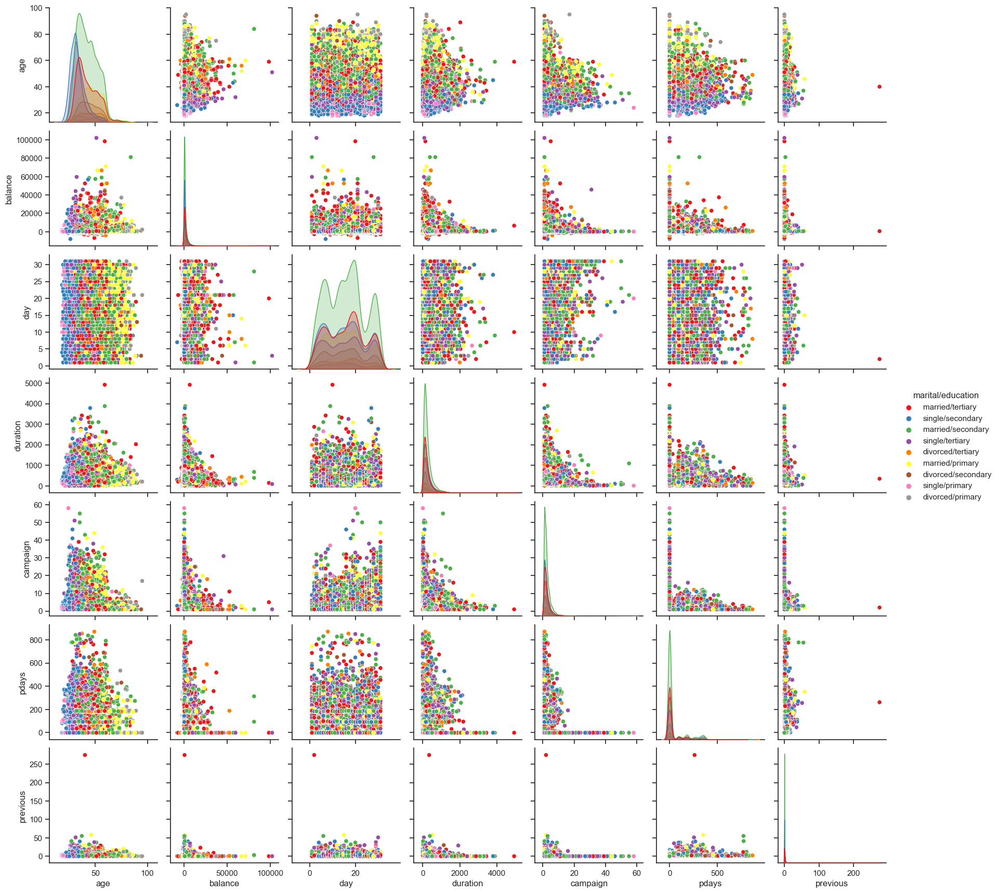

In [205]:
sns.set(style="ticks")

sns.pairplot(bank, hue="marital/education", palette="Set1")
plt.show()

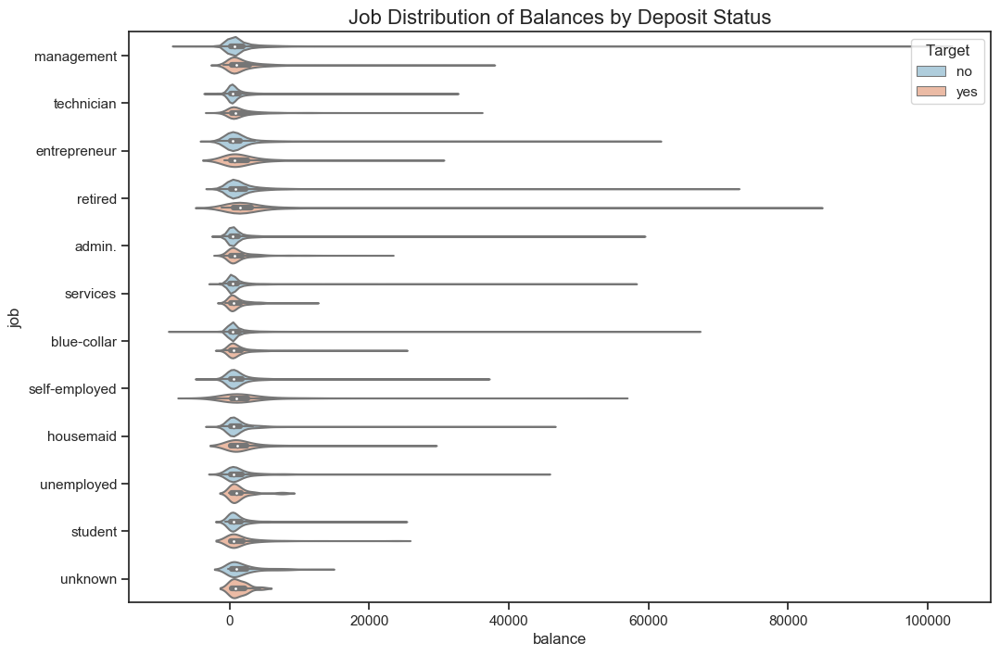

In [206]:
fig = plt.figure(figsize=(12,8))

sns.violinplot(x="balance", y="job", hue="Target", palette="RdBu_r",
            data=bank);

plt.title("Job Distribution of Balances by Deposit Status", fontsize=16)

plt.show()

#### Campaign Duration:
- **Campaign Duration:** We see that duration has a high correlation with term deposits meaning the higher the duration, the more likely it is for a client to open a term deposit.

- **Average Campaign Duration:** The average campaign duration is 374.76, let's see if clients that were above this average were more likely to open a term deposit.

- **Duration Status:** People who were above the duration status, were more likely to open a term deposit. 78% of the group that is above average in duration opened term deposits while those that were below average 32% opened term deposit accounts. This tells us that it will be a good idea to target individuals who are in the above average category.

In [207]:
# Let's drop marital/education and balance status
bank.drop(['marital/education'], axis=1, inplace=True)

In [208]:
bank.head()

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target,balance_status
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no,low
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no,low
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no,low
5,35,management,married,tertiary,no,231,yes,no,unknown,5,may,139,1,-1,0,unknown,no,low
6,28,management,single,tertiary,no,447,yes,yes,unknown,5,may,217,1,-1,0,unknown,no,low


In [209]:
# bank_cor = bank.corr()
# plt.figure(figsize=(12,8))
# sns.heatmap(bank_cor,linewidth=0.5)

**Correlation Plots**

- let's find correlation among our Data set
- Let's scale both numeric and categorical vaues
- Then let's use a correlation matrix
- With that we can determine if duration has influence on term deposits


#### Strong correlation between:
- Duration and the Target: makes sense because users already were in a contract
- Day and Campaign: I think from a marketing perspective, most deals are done on the last day of the month in order to hit targets, so it makes sense that there is a strong correlation between calls made on the last day of the month
- Previous and PDays: any previous contact will naturally correlate to the number of contacts made prior to this campaign

<Figure size 1200x800 with 0 Axes>

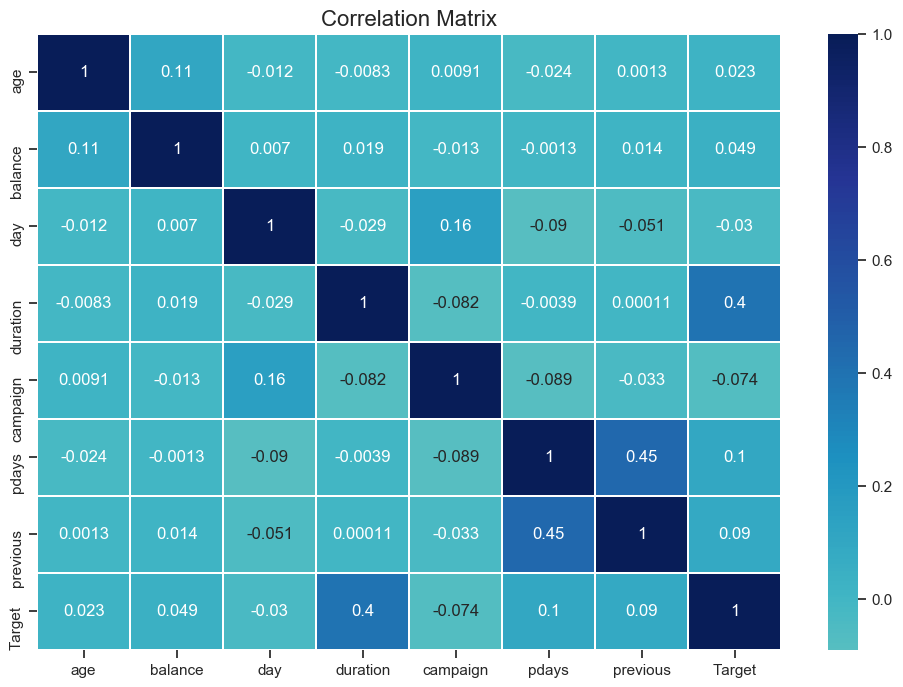

In [210]:
from sklearn.preprocessing import StandardScaler, OneHotEncoder, LabelEncoder
fig = plt.figure(figsize=(12,8))
bank['Target'] = LabelEncoder().fit_transform(bank['Target'])

# Separate both dataframes into 
numeric_bank = bank.select_dtypes(exclude="object")
# categorical_bank = bank.select_dtypes(include="object")

corr_numeric = numeric_bank.corr()

plt.figure(figsize=(12,8))

sns.heatmap(bank.corr(),
            annot=True,
            linewidths=.5,
            center=0,
            cbar=True,            
#           cmap="RdBu_r"
            cmap="YlGnBu")
plt.title("Correlation Matrix", fontsize=16)
plt.show()

**The Impact of Duration and Opening a Term Target**

- The longer the last contact with customer lasted, the higher percentage of subscribing to a term deposit. This completely makes sense as the more time you spend with the customer the more they are listening you the sales pitch allowing the sales person to explain all the features and benefits of the product

In [211]:
# bank_data_2 = bank


# sns.set(rc={'figure.figsize':(11.7,8.27)})
# sns.set_style('whitegrid')
# avg_duration = bank_data_2['duration'].mean()

# lst = [bank_data_2]
# bank_data_2["duration_status"] = np.nan

# for col in lst:
#     col.loc[col["duration"] < avg_duration, "duration_status"] = "below_average"
#     col.loc[col["duration"] > avg_duration, "duration_status"] = "above_average"
    
# pct_term = pd.crosstab(bank_data_2['duration_status'], bank_data_2['Target']).apply(lambda r: round(r/r.sum(), 2) * 100, axis=1)


# ax = pct_term.plot(kind='bar', stacked=False, cmap='RdBu')
# plt.title("The Impact of Duration \n in Opening a Term Target", fontsize=18)
# plt.xlabel("Duration Status", fontsize=18);
# plt.ylabel("Percentage (%)", fontsize=18)

# for p in ax.patches:
#     ax.annotate(str(p.get_height()), (p.get_x() * 1.02, p.get_height() * 1.02))
    

# plt.show()

# 2. Preparing the data for Logistic Regression

**Imputing** unknown **values of categorical columns**
In the previous task we have seen some categorical variables have a value called unknown. unknown values are a kind of missing data. Depending on the use case, we can decide how to deal with these values. One method is to directly impute them with the mode value of respective columns.

- The code below imputes the value unknown in the categorical columns with the mode value of that column. You can modify this function to replace any unwanted value(for e.g NaN value) in a column with a value of your choice.

In [212]:
# Impute mising values of categorical data with mode
for column in categorical_col:
    mode = bank[column].mode()[0]
    bank[column] = bank[column].replace('unknown',mode)

In [213]:
# convert just columns "Target" to object 
# bank["Target"] = bank["Target"].astype(object)

# Let's drop marital/education and balance status
bank.drop(['balance_status'], axis=1, inplace=True)

In [214]:
bank_data_LR = bank

In [215]:
bank_data_LR.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 39971 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        39971 non-null  int64 
 1   job        39971 non-null  object
 2   marital    39971 non-null  object
 3   education  39971 non-null  object
 4   default    39971 non-null  object
 5   balance    39971 non-null  int64 
 6   housing    39971 non-null  object
 7   loan       39971 non-null  object
 8   contact    39971 non-null  object
 9   day        39971 non-null  int64 
 10  month      39971 non-null  object
 11  duration   39971 non-null  int64 
 12  campaign   39971 non-null  int64 
 13  pdays      39971 non-null  int64 
 14  previous   39971 non-null  int64 
 15  poutcome   39971 non-null  object
 16  Target     39971 non-null  int64 
dtypes: int64(8), object(9)
memory usage: 6.7+ MB


#### Treating outliers in the continuous columns

- In logistic regression, a set of observations whose values deviate from the expected range and produce extremely large residuals and may indicate a sample peculiarity is called outliers. These outliers can unduly influence the results of the analysis and lead to incorrect inferences.
- Outliers can be treated in a variety of ways. It depends on the skewness of the feature.
- To reduce right skewness, we use roots or logarithms or reciprocals (roots are weakest). This is the most common problem in practice.
- To reduce left skewness, we take squares or cubes or higher powers.
- But in our data, some of the features have negative values and also the value 0. In such cases, square root transform or logarithmic transformation cannot be used since we cannot take square root of negative values and logarithm of zero is not defined.
- Hence for this data we use a method called Winsorization. In this method we define a confidence interval of let's say 90% and then replace all the outliers below the 5th percentile with the value at 5th percentile and all the values above 95th percentile with the value at the 95th percentile. It is pretty useful when there are negative values and zeros in the features which cannot be treated with log transforms or square roots. Do read up on it more here
- code below that treats all the outliers in the numeric features using winsorization.

#### Outlier treatment with winsoriation

In [216]:
from scipy.stats.mstats import winsorize

numeric_col = bank_data_LR.select_dtypes(include=np.number).columns

for col in numeric_col:    
    bank_data_LR[col] = winsorize(bank_data_LR[col], limits=[0.05, 0.1],inclusive=(True, True))

**Function to Label Encode Categorical variables**

Before applying our machine learning algorithm, we need to recollect that any algorithm can only read numerical values. It is therefore essential to encode categorical features into numerical values. Encoding of categorical variables can be performed in two ways:

Label Encoding
One-Hot Encoding.
For the given dataset, we are going to label encode the categorical columns.

In the code below we will perform label encoding on all the categorical features and also the target (since it is categorical) in the dataset. You can modify the below function in order to perform One-Hot Encoding as well.

In [217]:
# Initializing lable encoder
le = LabelEncoder()

# Initializing Label Encoder
le = LabelEncoder()

# Iterating through each of the categorical columns and label encoding them
for feature in categorical_col:
    try:
        bank_data_LR[feature] = le.fit_transform(bank_data_LR[feature])
    except:
        print('Error encoding '+feature)

**Train 70% / Test 30% split**

In [218]:
### Define X and Y variables - storing predictors and target in X and y variables

X = bank_data_LR.drop('Target', axis=1)
y = bank_data_LR['Target'] # target variable

### Split the data into train (70%) and test (30%)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30,random_state=7)

Now lets check Term Deposit Subscribers True/False ratio in split data

In [219]:
print("Original Term Deposit Subscribers True Values    : {0} ({1:0.2f}%)".format(len(bank_data_LR.loc[bank_data_LR['Target'] == 1]), (len(bank_data_LR.loc[bank_data_LR['Target'] == 1])/len(bank_data_LR.index)) * 100))
print("Original Term Deposit Subscribers False Values   : {0} ({1:0.2f}%)".format(len(bank_data_LR.loc[bank_data_LR['Target'] == 0]), (len(bank_data_LR.loc[bank_data_LR['Target'] == 0])/len(bank_data_LR.index)) * 100))
print("")
print("Training Term Deposit Subscribers True Values    : {0} ({1:0.2f}%)".format(len(y_train[y_train[:] == 1]), (len(y_train[y_train[:] == 1])/len(y_train)) * 100))
print("Training Term Deposit Subscribers False Values   : {0} ({1:0.2f}%)".format(len(y_train[y_train[:] == 0]), (len(y_train[y_train[:] == 0])/len(y_train)) * 100))
print("")
print("Test Term Deposit Subscribers True Values        : {0} ({1:0.2f}%)".format(len(y_test[y_test[:] == 1]), (len(y_test[y_test[:] == 1])/len(y_test)) * 100))
print("Test Term Deposit Subscribers False Values       : {0} ({1:0.2f}%)".format(len(y_test[y_test[:] == 0]), (len(y_test[y_test[:] == 0])/len(y_test)) * 100))
print("")

Original Term Deposit Subscribers True Values    : 4750 (11.88%)
Original Term Deposit Subscribers False Values   : 35221 (88.12%)

Training Term Deposit Subscribers True Values    : 3300 (11.79%)
Training Term Deposit Subscribers False Values   : 24679 (88.21%)

Test Term Deposit Subscribers True Values        : 1450 (12.09%)
Test Term Deposit Subscribers False Values       : 10542 (87.91%)



In [220]:
# Feature Scaling / normalization

# how to scale everything except the target variable:
# https://stackoverflow.com/questions/38420847/apply-standardscaler-to-parts-of-a-data-set

from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

### The confusion matrix:

So now we have to decide which one is the best model, and we have two types of wrong values:

**False Positive,** means the client do NOT SUBSCRIBED to term deposit, but the model thinks he did.
**False Negative,** means the client SUBSCRIBED to term deposit, but the model said he dont.

In my opinion:

The first one its most harmful, because we think that we already have that client but we dont and maybe we lost him in other future campaings.

The second its not good but its ok, we have that client and in the future we'll discovery that in truth he's already our client

So, our objective here, is to find the best model by confusion matrix with the lowest False Positive as possible.

**True Positives (TP):** we correctly predicted that they have taken Term Deposit.

**True Negatives (TN):** we correctly predicted that they have not taken Term Deposit.

**False Positives (FP):** we incorrectly predicted that have taken Term Deposit (a "Type I error"). Falsely predicted positive Type I error.

**False Negatives (FN):** we incorrectly predicted that they have not taken Term Deposit (a "Type II error"). Falsely predicted negative Type II error.


### Precision and Recall:

**Recall:** Is the total number of "Yes" in the label column of the dataset. So how many "Yes" labels does our model detect.

**Precision:** Means how sure is the prediction of our model that the actual label is a "Yes".

### Recall Precision Tradeoff:
As the precision gets higher the recall gets lower and vice versa. For instance, if we increase the precision from 30% to 60% the model is picking the predictions that the model believes is 60% sure. If there is an instance where the model believes that is 58% likely to be a potential client that will suscribe to a term deposit then the model will classify it as a "No." However, that instance was actually a "Yes" (potential client did suscribe to a term deposit.) That is why the higher the precision the more likely the model is to miss instances that are actually a "Yes"!


### F1-SCORE
F1-Score is a "median" of Recall and Precision, consider this when you want a balance between. F1 Score is the weighted average of Precision and Recall. Therefore, this score takes both false positives and false negatives into account. Intuitively it is not as easy to understand as accuracy, but F1 is usually more useful than accuracy, especially if you have an uneven class distribution.


### ROC / AUC 
Accuracy is measured by the area under the ROC curve. An area of 1 represents a perfect test; an area of .5 represents a worthless test.

A rough guide for classifying the accuracy of a diagnostic test is the traditional academic point system:

.90-1 = excellent (A)

.80-.90 = good (B)

.70-.80 = fair (C)

.60-.70 = poor (D)

.50-.60 = fail (F)

# 3. Ensemble Methods

# Logistic Regression:
Use Logistic Regression model to predict the "Target" variable. Print all the metrics related for evaluating the model performance

In [221]:
from sklearn.metrics import confusion_matrix, recall_score, precision_score, f1_score, roc_auc_score,accuracy_score
from sklearn.linear_model import LogisticRegression

logreg = LogisticRegression(random_state=7)
logreg.fit(X_train, y_train)                    # fit the model on train data

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=7, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)

In [222]:
### These are the probabilities based on 80% threshold on test data
Threshold_50 = 0.80
logreg.predict_proba(X_test)

array([[0.95663785, 0.04336215],
       [0.99048088, 0.00951912],
       [0.88374825, 0.11625175],
       ...,
       [0.95507393, 0.04492607],
       [0.61801312, 0.38198688],
       [0.93623101, 0.06376899]])

In [223]:
### If the probability is greater than the threshold (50%), then it is '1' otherwise '0'
### '1' means that the customer accepted the personal loan
preds = np.where(logreg.predict_proba(X_test)[:,1]>Threshold_50, 1,0)
preds

array([0, 0, 0, ..., 0, 0, 0])

In [224]:
# Predicting the target variable on test data
y_predict = logreg.predict(X_test)              

In [225]:
# Observe the predicted and observed classes in a dataframe.
# if feature scaling is turned on -this wont' show
# z = X_test.copy()
# z['Observed Term Deposit Subscribers Status'] = y_test
# z['Predicted Term Deposit Subscribers Status'] = y_predict
# z.head()

In [226]:
## function to get confusion matrix in a proper format
def draw_cm( actual, predicted ):
    cm = confusion_matrix( actual, predicted)
    sns.heatmap(cm, annot=True,  fmt='.2f', xticklabels = [0,1] , yticklabels = [0,1] )
    plt.ylabel('Observed')
    plt.xlabel('Predicted')
    plt.show()

Trainig accuracy 0.8903820722684871

Testing accuracy 0.8862575050033356

Confusion Matrix


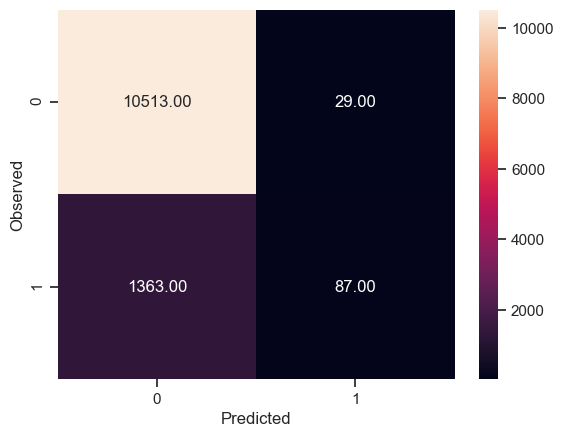

None

Recall: 0.06 %

Precision: 0.75 %

F1 Score: 0.11 %

Roc Auc Score: 0.53 %


In [227]:
print("Trainig accuracy",logreg.score(X_train,y_train))  
print()
print("Testing accuracy",logreg.score(X_test, y_test))
print()
print('Confusion Matrix')
print(draw_cm(y_test,preds))
print()
print("Recall:",round(recall_score(y_test,preds),2),"%")
print()
print("Precision:",round(precision_score(y_test,preds),2),"%")
print()
print("F1 Score:",round(f1_score(y_test,preds),2),"%")
print()
print("Roc Auc Score:",round(roc_auc_score(y_test,preds),2),"%")

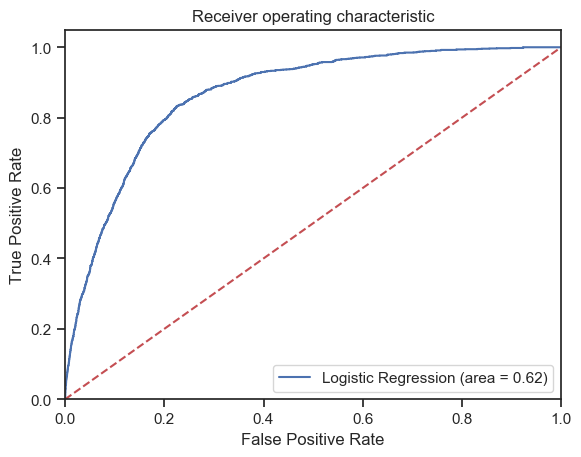

In [228]:
# AUC ROC curve
# from sklearn.metrics import roc_auc_score
# from sklearn.metrics import roc_curve

logit_roc_auc = roc_auc_score(y_test, logreg.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, logreg.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

**Improving Model Performance via Checking Parameters of Logistic Regression**

In [229]:
# Checking Parameters of logistic regression
logreg.get_params()

#If we dont specify the parameters in the model it takes default value

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': 7,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

#### Checking Parameters of Logistic Regression

https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.LogisticRegression.html

* This is an introduction to let you know that all the algorithms have parameters aand changing those parameters affects the model performance. How to regularize parameter is covered in FMST module.

* By changing a binary classifier parameter (the threshold for a logistic regression classifier), the precision and recall will also change


**Solvers options:** Solving logistic regression is an optimization problem. There are several solver algorithms we can use to test different parameters.

**ref: https://towardsdatascience.com/dont-sweat-the-solver-stuff-aea7cddc3451**

Scikit-learn has five different solvers. Each solver tries to find the parameter weights that minimize a cost function. Here are the five options we will use:<br>

* newton-cg — A newton method. Newton methods use an exact Hessian matrix. It's slow for large datasets, because it computes the second derivatives.

* lbfgs — Stands for Limited-memory Broyden–Fletcher–Goldfarb–Shanno. It approximates the second derivative matrix updates with gradient evaluations. It stores only the last few updates, so it saves memory. It isn't super fast with large data sets. It will be the default solver as of Scikit-learn version 0.22.0.

* liblinear — Library for Large Linear Classification. Uses a coordinate descent algorithm. Coordinate descent is based on minimizing a multivariate function by solving univariate optimization problems in a loop. In other words, it moves toward the minimum in one direction at a time. It is the default solver for Scikit-learn versions earlier than 0.22.0. It performs pretty well with high dimensionality. It does have a number of drawbacks. It can get stuck, is unable to run in parallel, and can only solve multi-class logistic regression with one-vs.-rest.

* sag — Stochastic Average Gradient descent. A variation of gradient descent and incremental aggregated gradient approaches that uses a random sample of previous gradient values. Fast for big datasets.

* saga — Extension of sag that also allows for L1 regularization. Should generally train faster than sag.

In [230]:
# Running a loop to check different values of 'solver'
# all solver can be used with penalty l2, only 'liblinear' and 'saga' works with both 'l1' and 'l2'

train_score=[]
test_score=[]
solver = ['newton-cg','lbfgs','liblinear','sag','saga']
for i in solver:
    model = LogisticRegression(random_state=42,penalty='l2', C = 0.75,solver=i)  # changing values of solver
    model.fit(X_train, y_train) 
    y_predict = model.predict(X_test)     
    train_score.append(round(model.score(X_train, y_train),3))
    test_score.append(round(model.score(X_test, y_test),3))
    
print(solver)
print()
print(train_score)
print()
print(test_score)

['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']

[0.89, 0.89, 0.89, 0.89, 0.89]

[0.886, 0.886, 0.886, 0.886, 0.886]


In [231]:
train_score=[]
test_score=[]
solver = ['liblinear','saga']   # changing values of solver which works with 'l1'
for i in solver:
    model = LogisticRegression(random_state=42,penalty='l1', C = 0.75,solver=i)  #changed penalty to 'l1'
    model.fit(X_train, y_train) 
    y_predict = model.predict(X_test)     
    train_score.append(round(model.score(X_train, y_train),3))
    test_score.append(round(model.score(X_test, y_test),3))
    
print(solver)
print()
print(train_score)
print()
print(test_score)

['liblinear', 'saga']

[0.89, 0.89]

[0.886, 0.886]


In [232]:
model = LogisticRegression(random_state=42,penalty='l1',solver='liblinear',class_weight='balanced') # changing class weight to balanced

model.fit(X_train, y_train) 

y_predict = model.predict(X_test)     

print("Trainig accuracy",model.score(X_train,y_train))  
print()
print("Testing accuracy",model.score(X_test, y_test))

Trainig accuracy 0.7975981986489867

Testing accuracy 0.7992828552368245


In [233]:
# Running a loop to check different values of 'C'

train_score=[]                                 
test_score=[]
C = [0.01,0.1,0.25,0.5,0.75,1]
for i in C:
    model = LogisticRegression(random_state=42,penalty='l1', solver='liblinear',class_weight='balanced', C=i)  # changing values of C
    model.fit(X_train, y_train) 
    y_predict = model.predict(X_test)     
    train_score.append(round(model.score(X_train,y_train),3)) # appending training accuracy in a blank list for every run of the loop
    test_score.append(round(model.score(X_test, y_test),3))   # appending testing accuracy in a blank list for every run of the loop
    
print(C)
print()
print(train_score)
print()
print(test_score)

[0.01, 0.1, 0.25, 0.5, 0.75, 1]

[0.794, 0.797, 0.798, 0.798, 0.798, 0.798]

[0.795, 0.799, 0.799, 0.799, 0.799, 0.799]


In [234]:
# Running a loop to check different values of 'solver'
# all solver can be used with penalty l2, only 'liblinear' and 'saga' works with both 'l1' and 'l2'

train_score=[]
test_score=[]
solver = ['newton-cg','lbfgs','liblinear','sag','saga']
for i in solver:
    model = LogisticRegression(random_state=42,penalty='l2', C = 0.75,solver=i)  # changing values of solver
    model.fit(X_train, y_train) 
    y_predict = model.predict(X_test)     
    train_score.append(round(model.score(X_train, y_train),3))
    test_score.append(round(model.score(X_test, y_test),3))
    
print(solver)
print()
print(train_score)
print()
print(test_score)

['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']

[0.89, 0.89, 0.89, 0.89, 0.89]

[0.886, 0.886, 0.886, 0.886, 0.886]


**Comment:** 

Compared to the first logistic regression model, this showed some marked improveements:


- Using the solver='liblinear', class_weight='balanced',C=0.5O, proved to be the best logistic regression model verall the application on the testing data achieved a good accuracy of 0.84%

Trainig accuracy 0.7975981986489867

Testing accuracy 0.7991994663108739

Confusion Matrix


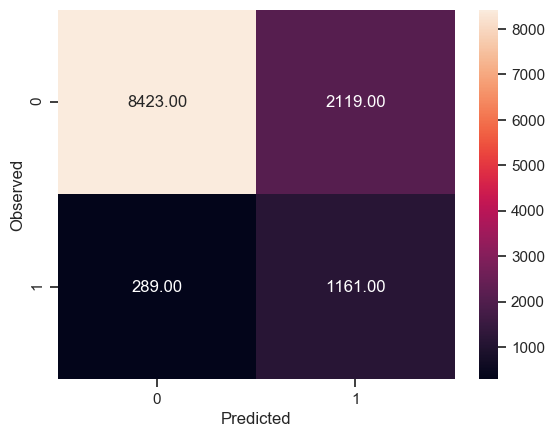

None

Recall: 0.8006896551724138

Precision: 0.3539634146341463

F1 Score: 0.4909090909090909

Roc Auc Score: 0.7998420766850497


In [235]:
#Therefore final model is
model = LogisticRegression(random_state=42,penalty='l2', solver='liblinear', class_weight='balanced',C=0.5) 
model.fit(X_train, y_train)
y_predict = model.predict(X_test)
print("Trainig accuracy",model.score(X_train,y_train))  
print()
print("Testing accuracy",model.score(X_test, y_test))
print()
print('Confusion Matrix')
print(draw_cm(y_test,y_predict))
print()
print("Recall:",recall_score(y_test,y_predict))
print()
print("Precision:",precision_score(y_test,y_predict))
print()
print("F1 Score:",f1_score(y_test,y_predict))
print()
print("Roc Auc Score:",roc_auc_score(y_test,y_predict))

In [236]:
logReg_test_train = model.predict(X_train)
logReg_test = model.predict(X_test)

logReg = accuracy_score(y_test, logReg_test)

In [237]:
#Store the accuracy results for each model in a dataframe for final comparison
resultsDf = pd.DataFrame({'Method':['Logistic Regression'], 'accuracy': logReg})
resultsDf = resultsDf[['Method', 'accuracy']]
resultsDf

# tempResultsDf = pd.DataFrame({'Method':['Logistic Regression'], 'accuracy': [logReg]})
# resultsDf = pd.concat([resultsDf, tempResultsDf])
# resultsDf = resultsDf[['Method', 'accuracy']]
# resultsDf

,Method,accuracy
0,Logistic Regression,0.799199


# Decision Tree:
Use Decision Tree model to predict the "Target" variable. Print all the metrics related for evaluating the model performance

Won't be affected by outliers: Decision tree will first split signal data points. At this point, we need to prune the Decision tree so that outliers are not processed.

In [238]:
bank_data_DT = bank
# bank_data_DT.drop(["duration_status"], axis=1, inplace=True)

In [239]:
bank_data_DT.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 39971 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype
---  ------     --------------  -----
 0   age        39971 non-null  int64
 1   job        39971 non-null  int64
 2   marital    39971 non-null  int64
 3   education  39971 non-null  int64
 4   default    39971 non-null  int64
 5   balance    39971 non-null  int64
 6   housing    39971 non-null  int64
 7   loan       39971 non-null  int64
 8   contact    39971 non-null  int64
 9   day        39971 non-null  int64
 10  month      39971 non-null  int64
 11  duration   39971 non-null  int64
 12  campaign   39971 non-null  int64
 13  pdays      39971 non-null  int64
 14  previous   39971 non-null  int64
 15  poutcome   39971 non-null  int64
 16  Target     39971 non-null  int64
dtypes: int64(17)
memory usage: 6.7 MB


#### Split Data 70% train | 30% test

In [240]:
# splitting data into training and test set for independent attributes
from sklearn.model_selection import train_test_split

features = [col for col in bank_data_DT.columns if col != 'Target']

X_train, X_test, y_train, y_test = train_test_split(bank_data_DT[features], bank_data_DT['Target'], test_size=.3, random_state=22)
X_train.shape, X_test.shape

((27979, 16), (11992, 16))

#### Build Decision Tree Model

We will build our model using the DecisionTreeClassifier function. Using default 'gini' criteria to split. Other option include 'entropy'.  

In [241]:
from sklearn.tree import DecisionTreeClassifier

## Use Entropy split later
# dt_model = DecisionTreeClassifier(criterion = 'entropy' )
# dt_model.fit(train_set, train_labels)

## Use Entropy split later
# dTree = DecisionTreeClassifier(criterion = 'gini', random_state=1)
# dTree.fit(X_train, y_train)

## # invoking the decision tree classifier function. Using 'entropy' method of finding the split columns. Other option 
# could be gini index.  
model_entropy = DecisionTreeClassifier(criterion='entropy')
model_entropy.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

#### Print the accuracy of the model & print the confusion matrix

In [242]:
print("Train: %.2f" % model_entropy.score(X_train, y_train))  # performance on train data
print("Test: %.2f" % model_entropy.score(X_test, y_test))  # performance on test data

Train: 1.00
Test: 0.87


#### There is a degree of overfitting in the model due to which the test accuracy drops somewhat. This shows why decision trees are prone to overfitting. 

#### Regularize/prune the decision tree by limiting the max. depth of trees and print the accuracy.

In [243]:
clf_pruned = DecisionTreeClassifier(criterion = "entropy", max_depth=4)
clf_pruned.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='entropy',
                       max_depth=4, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

**Train and Test sets are equal which means overfitting is not a problem anymore**

In [244]:
print("Train: %.2f" % clf_pruned.score(X_train, y_train))  # performance on train data
print("Test: %.2f" % clf_pruned.score(X_test, y_test))  # performance on test data

Train: 0.89
Test: 0.89


In [245]:
# Checking Parameters of Decision Tree
clf_pruned.get_params()

#If we dont specify the parameters in the model it takes default value

{'ccp_alpha': 0.0,
 'class_weight': None,
 'criterion': 'entropy',
 'max_depth': 4,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'presort': 'deprecated',
 'random_state': None,
 'splitter': 'best'}

In [246]:
y_train.value_counts()

0    24640
1     3339
Name: Target, dtype: int64

In [247]:
preds_train = clf_pruned.predict(X_train)
preds_test = clf_pruned.predict(X_test)

acc_DT = accuracy_score(y_test, preds_test)

## Decision tree performance

In [248]:
# Confusion matrix
pd.crosstab(y_test, preds_test, rownames=['Actual'], colnames=['Predicted'])

Predicted,0,1
Actual,,
0,10304,277
1,998,413


Confusion Matrix


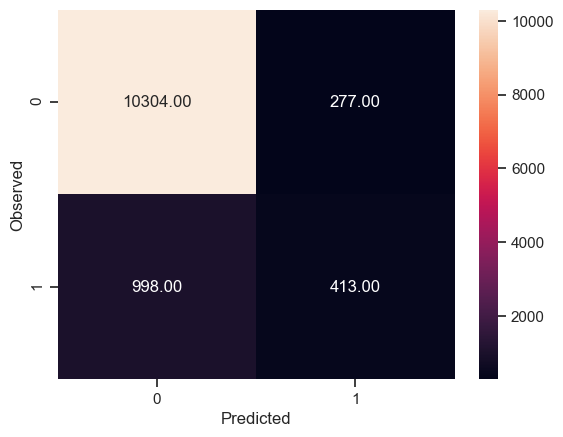

None

Recall: 0.29 %

Precision: 0.6 %

F1 Score: 0.39 %

Roc Auc Score: 0.63 %


In [249]:
print('Confusion Matrix')
print(draw_cm(y_test,preds_test)) # change the model here
print()
print("Recall:",round(recall_score(y_test,preds_test),2),"%")
print()
print("Precision:",round(precision_score(y_test,preds_test),2),"%")
print()
print("F1 Score:",round(f1_score(y_test,preds_test),2),"%")
print()
print("Roc Auc Score:",round(roc_auc_score(y_test,preds_test),2),"%")

ClassificationReport(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x7fa1e1e794d0>,
                     classes=None,
                     cmap=<matplotlib.colors.ListedColormap object at 0x7fa1c7e61510>,
                     encoder=None, force_model=False, is_fitted='auto',
                     model=None, support=None)

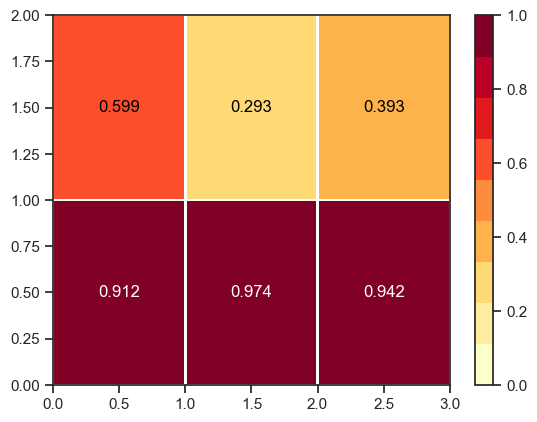

In [250]:
# Visualize model performance with yellowbrick library

from yellowbrick.classifier import ClassificationReport, ROCAUC

viz = ClassificationReport(DecisionTreeClassifier(criterion = "entropy", max_depth=4))
viz.fit(X_train, y_train)
viz.score(X_test, y_test)
viz

ROCAUC(ax=<matplotlib.axes._subplots.AxesSubplot object at 0x7fa1b8b60a50>,
       binary=None, classes=None, encoder=None, force_model=False,
       is_fitted='auto', macro=True, micro=True, model=None, per_class=True)

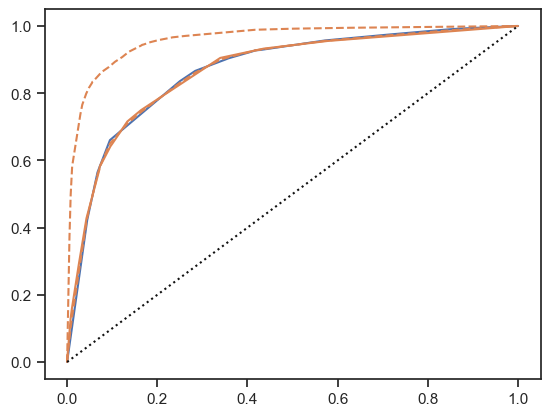

In [251]:
roc = ROCAUC(DecisionTreeClassifier(criterion = "entropy", max_depth=4))
roc.fit(X_train, y_train)
roc.score(X_test, y_test)
roc

In [252]:
bank_data_DT['ProbQuality_5'] = clf_pruned.predict_proba(bank_data_DT[features])[:,0]
bank_data_DT['ProbQuality_6'] = clf_pruned.predict_proba(bank_data_DT[features])[:,1]
# bank_data_DT['ProbQuality_8'] = clf_pruned.predict_proba(bank_data_DT[features])[:,2]
bank_data_DT.head(10)

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,Target,ProbQuality_5,ProbQuality_6
0,56,4,1,2,0,2143,1,0,0,5,8,261,1,-1,0,3,0,0.985816,0.014184
1,44,9,2,1,0,29,1,0,0,5,8,151,1,-1,0,3,0,0.985816,0.014184
2,33,2,1,1,0,2,1,1,0,5,8,76,1,-1,0,3,0,0.985816,0.014184
5,35,4,1,2,0,231,1,0,0,5,8,139,1,-1,0,3,0,0.985816,0.014184
6,28,4,2,2,0,447,1,1,0,5,8,217,1,-1,0,3,0,0.985816,0.014184
7,42,2,0,2,1,2,1,0,0,5,8,380,1,-1,0,3,0,0.985816,0.014184
8,56,5,1,0,0,121,1,0,0,5,8,50,1,-1,0,3,0,0.985816,0.014184
9,43,9,2,1,0,593,1,0,0,5,8,55,1,-1,0,3,0,0.985816,0.014184
10,41,0,0,1,0,270,1,0,0,5,8,222,1,-1,0,3,0,0.985816,0.014184
11,29,0,2,1,0,390,1,0,0,5,8,137,1,-1,0,3,0,0.985816,0.014184


### When the tree is regularised, overfitting is reduced, but there is no increase in accuracy

Most important feature is duration, which makes sense. The longer you are on the call to a client the more likliehood of success!

In [254]:
## Calculating feature importance

feat_importance = clf_pruned.tree_.compute_feature_importances(normalize=False)


feat_imp_dict = dict(zip(features, clf_pruned.feature_importances_))
feat_imp = pd.DataFrame.from_dict(feat_imp_dict, orient='index')
feat_imp.sort_values(by=0, ascending=False)

,0
duration,0.552283
poutcome,0.146845
pdays,0.144159
housing,0.128706
month,0.019603
previous,0.004472
marital,0.003933
age,0.000000
job,0.000000
education,0.000000


In [255]:
#Store the accuracy results for each model in a dataframe for final comparison
tempResultsDf = pd.DataFrame({'Method':['Decision Tree'], 'accuracy': [acc_DT]})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'accuracy']]
resultsDf

,Method,accuracy
0,Logistic Regression,0.799199
0,Decision Tree,0.893679


### 1. Apply the Random forest model and print the accuracy of Random forest Model

In [256]:
from sklearn.ensemble import RandomForestClassifier
rfcl = RandomForestClassifier(n_estimators = 50)
rfcl = rfcl.fit(X_train, y_train)

In [257]:
pred_RF = rfcl.predict(X_test)
acc_RF = accuracy_score(y_test, pred_RF)

In [258]:
# Confusion matrix
pd.crosstab(y_test, pred_RF, rownames=['Actual'], colnames=['Predicted'])

Predicted,0,1
Actual,,
0,10260,321
1,891,520


Trainig accuracy 0.9997140712677365

Testing accuracy 0.8989326217478318

Confusion Matrix


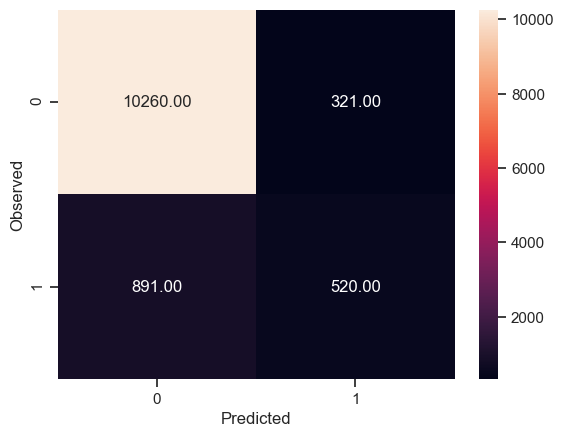

None

Recall: 0.37 %

Precision: 0.62 %

F1 Score: 0.46 %

Roc Auc Score: 0.67 %


In [259]:
print("Trainig accuracy",rfcl.score(X_train,y_train))  
print()
print("Testing accuracy",rfcl.score(X_test, y_test))
print()
print('Confusion Matrix')
print(draw_cm(y_test,pred_RF)) # change the model here
print()
print("Recall:",round(recall_score(y_test,pred_RF),2),"%")
print()
print("Precision:",round(precision_score(y_test,pred_RF),2),"%")
print()
print("F1 Score:",round(f1_score(y_test,pred_RF),2),"%")
print()
print("Roc Auc Score:",round(roc_auc_score(y_test,pred_RF),2),"%")

In [260]:
tempResultsDf = pd.DataFrame({'Method':['Random Forest'], 'accuracy': [acc_RF]})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'accuracy']]
resultsDf

,Method,accuracy
0,Logistic Regression,0.799199
0,Decision Tree,0.893679
0,Random Forest,0.898933


#### Compared to the decision tree, we can see that the accuracy has significantly improved for the Random forest model

## Adaboost

In [261]:
from sklearn.ensemble import AdaBoostClassifier
abcl = AdaBoostClassifier(n_estimators = 100, learning_rate=0.1, random_state=22)
abcl = abcl.fit(X_train, y_train)

In [262]:
pred_AB =abcl.predict(X_test)
acc_AB = accuracy_score(y_test, pred_AB)

In [263]:
# Confusion matrix
pd.crosstab(y_test, pred_AB, rownames=['Actual'], colnames=['Predicted'])

Predicted,0,1
Actual,,
0,10476,105
1,1215,196


Trainig accuracy 0.8859144358268701

Testing accuracy 0.8899266177451635

Confusion Matrix


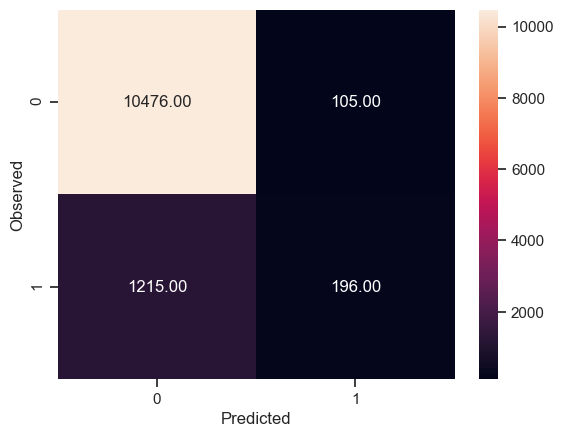

None

Recall: 0.14 %

Precision: 0.65 %

F1 Score: 0.23 %

Roc Auc Score: 0.56 %


In [264]:
print("Trainig accuracy",abcl.score(X_train,y_train))  
print()
print("Testing accuracy",abcl.score(X_test, y_test))
print()
print('Confusion Matrix')
print(draw_cm(y_test,pred_AB)) # change the model here
print()
print("Recall:",round(recall_score(y_test,pred_AB),2),"%")
print()
print("Precision:",round(precision_score(y_test,pred_AB),2),"%")
print()
print("F1 Score:",round(f1_score(y_test,pred_AB),2),"%")
print()
print("Roc Auc Score:",round(roc_auc_score(y_test,pred_AB),2),"%")

In [265]:
tempResultsDf = pd.DataFrame({'Method':['Adaboost'], 'accuracy': [acc_AB]})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'accuracy']]
resultsDf

,Method,accuracy
0,Logistic Regression,0.799199
0,Decision Tree,0.893679
0,Random Forest,0.898933
0,Adaboost,0.889927


### Apply Bagging Classifier Algorithm and print the accuracy.

In [266]:
from sklearn.ensemble import BaggingClassifier

bgcl = BaggingClassifier(n_estimators=50, max_samples= .7, bootstrap=True, oob_score=True, random_state=22)
bgcl = bgcl.fit(X_train, y_train)

In [267]:
pred_BG = bgcl.predict(X_test)
acc_BG = accuracy_score(y_test, pred_BG)

In [268]:
# Confusion matrix
pd.crosstab(y_test, pred_BG, rownames=['Actual'], colnames=['Predicted'])

Predicted,0,1
Actual,,
0,10202,379
1,832,579


Trainig accuracy 0.9935308624325387

Testing accuracy 0.8990160106737826

Confusion Matrix


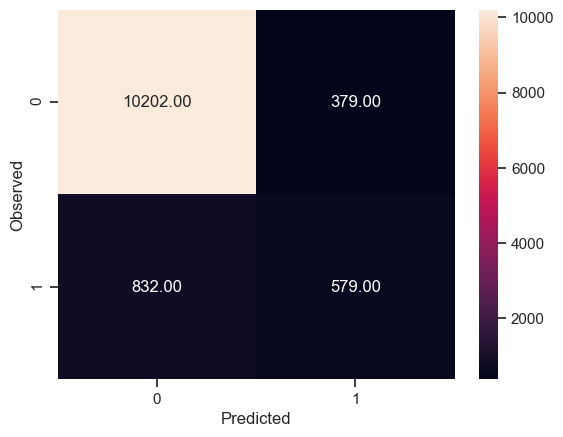

None

Recall: 0.41 %

Precision: 0.6 %

F1 Score: 0.49 %

Roc Auc Score: 0.69 %


In [269]:
print("Trainig accuracy",bgcl.score(X_train,y_train))  
print()
print("Testing accuracy",bgcl.score(X_test, y_test))
print()
print('Confusion Matrix')
print(draw_cm(y_test,pred_BG)) # change the model here
print()
print("Recall:",round(recall_score(y_test,pred_BG),2),"%")
print()
print("Precision:",round(precision_score(y_test,pred_BG),2),"%")
print()
print("F1 Score:",round(f1_score(y_test,pred_BG),2),"%")
print()
print("Roc Auc Score:",round(roc_auc_score(y_test,pred_BG),2),"%")

In [270]:
tempResultsDf = pd.DataFrame({'Method':['Bagging'], 'accuracy': [acc_BG]})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'accuracy']]
resultsDf

,Method,accuracy
0,Logistic Regression,0.799199
0,Decision Tree,0.893679
0,Random Forest,0.898933
0,Adaboost,0.889927
0,Bagging,0.899016


### GradientBoost Classifier

In [271]:
from sklearn.ensemble import GradientBoostingClassifier
gbcl = GradientBoostingClassifier(n_estimators = 50, learning_rate = 0.1, random_state=22)
gbcl = gbcl.fit(X_train, y_train)

In [272]:
# ??GradientBoostingClassifier

In [273]:
pred_GB = gbcl.predict(X_test)
acc_GB = accuracy_score(y_test, pred_GB)

In [274]:
# Confusion matrix
pd.crosstab(y_test, pred_GB, rownames=['Actual'], colnames=['Predicted'])

Predicted,0,1
Actual,,
0,10426,155
1,1033,378


Trainig accuracy 0.8963150934629543

Testing accuracy 0.9009339559706471

Confusion Matrix


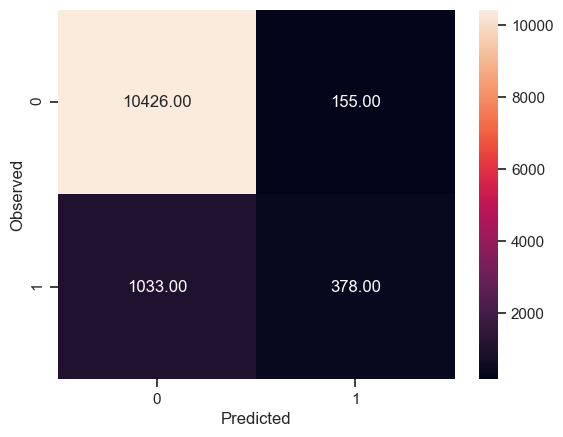

None

Recall: 0.27 %

Precision: 0.71 %

F1 Score: 0.39 %

Roc Auc Score: 0.63 %


In [275]:
print("Trainig accuracy",gbcl.score(X_train,y_train))  
print()
print("Testing accuracy",gbcl.score(X_test, y_test))
print()
print('Confusion Matrix')
print(draw_cm(y_test,pred_GB)) # change the model here
print()
print("Recall:",round(recall_score(y_test,pred_GB),2),"%")
print()
print("Precision:",round(precision_score(y_test,pred_GB),2),"%")
print()
print("F1 Score:",round(f1_score(y_test,pred_GB),2),"%")
print()
print("Roc Auc Score:",round(roc_auc_score(y_test,pred_GB),2),"%")

In [276]:
tempResultsDf = pd.DataFrame({'Method':['Gradient Boost'], 'accuracy': [acc_GB]})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'accuracy']]
resultsDf

,Method,accuracy
0,Logistic Regression,0.799199
0,Decision Tree,0.893679
0,Random Forest,0.898933
0,Adaboost,0.889927
0,Bagging,0.899016
0,Gradient Boost,0.900934


### Grid Search Random Forest

Hyperparameters are function attributes that we have to specify for an algorithm. Grid search is done to find out the best set of hyperparameters for the model.

In [277]:
from sklearn.model_selection import GridSearchCV

In [278]:
params_dict={"n_estimators":[5,10,500],"max_features":["auto","sqrt","log2"]}

In [279]:
## WARNING: THIS TAKES FOREVER TO RUN

clf_rf=GridSearchCV(estimator=RandomForestClassifier(n_jobs=-1), param_grid=params_dict,scoring="accuracy",cv=10)
clf_rf.fit(X_train,y_train)

GridSearchCV(cv=10, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=-1,
                                              oob_score=False,
                                              random

In [280]:
clf_rf

GridSearchCV(cv=10, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=-1,
                                              oob_score=False,
                                              random

In [281]:
clf_rf.best_score_

0.8941351948874049

In [282]:
clf_rf.best_params_

{'max_features': 'auto', 'n_estimators': 500}

In [283]:
pred = clf_rf.predict(X_test)
acc_GS = accuracy_score(y_test, pred)

In [284]:
# Confusion matrix
pd.crosstab(y_test, pred, rownames=['Actual'], colnames=['Predicted'])

Predicted,0,1
Actual,,
0,10288,293
1,898,513


Trainig accuracy 0.9999642589084671

Testing accuracy 0.9006837891927952

Confusion Matrix


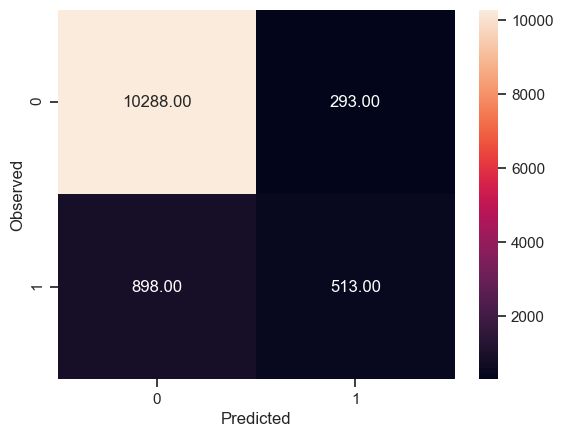

None

Recall: 0.36 %

Precision: 0.64 %

F1 Score: 0.46 %

Roc Auc Score: 0.67 %


In [285]:
print("Trainig accuracy",clf_rf.score(X_train,y_train))  
print()
print("Testing accuracy",clf_rf.score(X_test, y_test))
print()
print('Confusion Matrix')
print(draw_cm(y_test,pred)) # change the model here
print()
print("Recall:",round(recall_score(y_test,pred),2),"%")
print()
print("Precision:",round(precision_score(y_test,pred),2),"%")
print()
print("F1 Score:",round(f1_score(y_test,pred),2),"%")
print()
print("Roc Auc Score:",round(roc_auc_score(y_test,pred),2),"%")

In [286]:
tempResultsDf = pd.DataFrame({'Method':['Grid Search Random Forest'], 'accuracy': [acc_GS]})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'accuracy']]
resultsDf

,Method,accuracy
0,Logistic Regression,0.799199
0,Decision Tree,0.893679
0,Random Forest,0.898933
0,Adaboost,0.889927
0,Bagging,0.899016
0,Gradient Boost,0.900934
0,Grid Search Random Forest,0.900684


### Random Forest PCA

In [287]:
# Principle Component Analysis
# not neccessary to use on only 16 variables, but test it as see what the changes are
x=bank.drop("Target", axis=1)

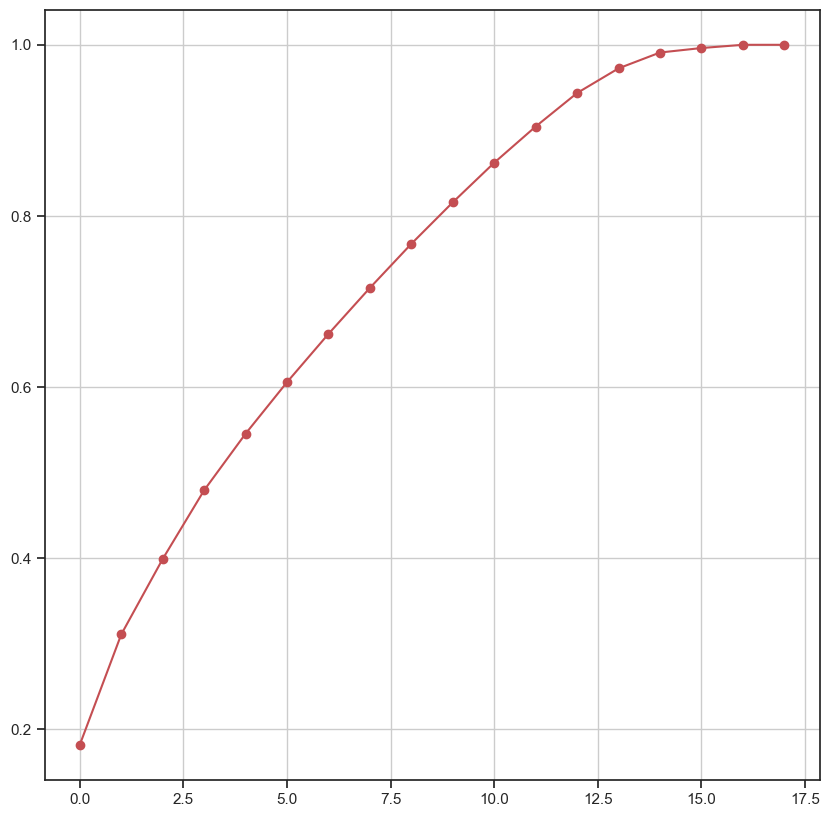

In [288]:
from sklearn.preprocessing import StandardScaler
sc=StandardScaler()
x=sc.fit_transform(x)

from sklearn.decomposition import PCA
pca=PCA()
x_pca=pca.fit_transform(x)

plt.figure(figsize=(10,10))
plt.plot(np.cumsum(pca.explained_variance_ratio_),"ro-")
plt.grid()

In [289]:
pca_new=PCA(n_components=8)
x_new=pca_new.fit_transform(x)

In [290]:
X_train,X_test,y_train,y_test=train_test_split(x_new,bank["Target"],test_size=.25,random_state=22)

In [291]:
rfc12 = RandomForestClassifier(n_estimators=200)
rfc12 = rfc12.fit(X_train, y_train)

pred_RF = rfc12.predict(X_test)
acc_RF = accuracy_score(y_test, pred_RF)

#### Precision and Recall:

**Recall:** Is the total number of "Yes" in the "Target" of the dataset. So how many "Yes" labels does our model detect. Here we got 33%

**Precision:** Means how sure is the prediction of our model that the actual label is a "Yes". Here we got 59%|



Trainig accuracy 0.9999666422042831

Testing accuracy 0.8943260282197538

Confusion Matrix


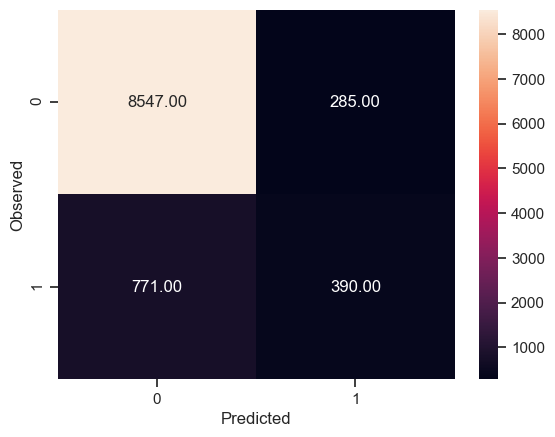

None

Recall: 0.34 %

Precision: 0.58 %

F1 Score: 0.42 %

Roc Auc Score: 0.65 %


In [292]:
print("Trainig accuracy",rfc12.score(X_train,y_train))  
print()
print("Testing accuracy",rfc12.score(X_test, y_test))
print()
print('Confusion Matrix')
print(draw_cm(y_test,pred_RF)) # change the model here
print()
print("Recall:",round(recall_score(y_test,pred_RF),2),"%")
print()
print("Precision:",round(precision_score(y_test,pred_RF),2),"%")
print()
print("F1 Score:",round(f1_score(y_test,pred_RF),2),"%")
print()
print("Roc Auc Score:",round(roc_auc_score(y_test,pred_RF),2),"%")

In [293]:
tempResultsDf = pd.DataFrame({'Method':[' Random Forest PCA'], 'accuracy': [acc_RF]})
resultsDf = pd.concat([resultsDf, tempResultsDf])
resultsDf = resultsDf[['Method', 'accuracy']]
resultsDf

,Method,accuracy
0,Logistic Regression,0.799199
0,Decision Tree,0.893679
0,Random Forest,0.898933
0,Adaboost,0.889927
0,Bagging,0.899016
0,Gradient Boost,0.900934
0,Grid Search Random Forest,0.900684
0,Random Forest PCA,0.894326


## Conclusion

- In predicting if the client will subscribe to a term deposit based on the analysis of the marketing campaigns the bank performed, various ensemble machine learning methods were used and evaluated.

- Depending on our risk factors such as limited marketing costs or making sure that we don't allow any true positives to slip through the net, our evaluation focus changes slightly.

- In my opinion 'False Positives' are the most harmful becuase a client did not subcribe to a term deposit, but the model think they did, which means we will also lost them in future campaigns, so we are continuously misplacing them.

- 'False Negatives' is not good either, but at least we will discover that they are client later on.

- So our best model should include the lowest 'False Positive' as possible, which is the 'GradientBoost' Model; it also has a 90% testing accuracy (equivalent to the highest), and also the highest 'Precision' score of 71%






# BONUS STUFF

## Black-box interpretation of models using LIME

In [294]:
# ! pip install lime

In [295]:
# conda install -c conda-forge lime

In [296]:
import lime 
import lime.lime_tabular

In [297]:
predict_fn_rf=lambda X_test:rfc12.predict_proba(X_test).astype(float)
X=X_train
explainer=lime.lime_tabular.LimeTabularExplainer(X,feature_names=bank.drop("Target",axis=1).columns,class_names=["Low","Medium","High"],kernel_width=5)

In [298]:
y_test.values[105]

0

In [299]:
choosen_instance=X_test[105]
exp=explainer.explain_instance(choosen_instance,predict_fn_rf,num_features=10,labels=[0,1])
exp.show_in_notebook(show_all=True)

In [300]:
y_test.values[110]

0

In [301]:
choosen_instance=X_test[110]
exp=explainer.explain_instance(choosen_instance,predict_fn_rf,num_features=10,labels=[1])
exp.show_in_notebook(show_all=True)

In [302]:
y_test.values[110]

0

In [303]:
choosen_instance=X_test[110]
exp=explainer.explain_instance(choosen_instance,predict_fn_rf,num_features=10,labels=[0,1])
exp.show_in_notebook(show_all=True)